# 1. Markowitz Portfolio Optimization

The **Markowitz approach** for portfolio optimization, known as the **efficient frontier theory**, is a theoretical model that helps investors build a portfolio that maximizes expected return for each level of risk or, conversely, minimizes risk for a given level of return.

## 1. Assumptions of Markowitz’s Theory
1) Investors want to maximize return and minimize risk

2) The risk of a portfolio can be reduced through **diversification**

## 2. Expected Return and Volatility
Markowitz takes into account two main metrics for evaluating the portfolio

**1) Expected Return:** The weighted average of the expected returns of the assets in the portfolio. It represents how much can be earned on average by investing in that portfolio.

**2) Risk or Volatility:** The standard deviation of the portfolio's returns, which measures the variability or uncertainty associated with that return

## 3. Correlation and the Covariance Matrix
The risk of a portfolio is not just the sum of the risks of the individual assets, but also depends on the **correlation** between them. The **covariance matrix** reflects how assets move together, allowing the calculation of the total risk of the portfolio accurately.

**Diversification and correlation:** A portfolio can have lower risk than the individual assets thanks to diversification since if some assets go up while others go down, the combined effect can reduce the overall volatility.

## 4. Efficient Frontier
Markowitz demonstrates that, by combining assets in various proportions, it’s possible to trace a **curve of optimal portfolios** called the **efficient frontier**.
- Each portfolio represents the maximum possible return for a given level of risk.
- Any portfolio outside the frontier is less efficient since it offers a lower return for the same level of risk.


## 5. The Portfolio with the Highest Sharpe Ratio (Tangency Portfolio)
A special point on the efficient frontier is the tangency portfolio, which has the highest Sharpe Ratio.

This portfolio offers the best possible return for each unit of risk, making it an ideal portfolio for those who want the best risk-return trade-off.

## 6. Optimal Portfolio
According to Markowitz’s theory, if looking for an optimal trade-off between risk and return, the tangency portfolio with the highest Sharpe Ratio is theoretically the best choice.

# 2. Our Approach

We are going to proceed as follows:

**APPROACH 1:** We will use a **Monte Carlo simulation** approach to calculate the **efficient frontier** and then find the portfolio with the maximum **Sharpe Ratio** between those generated.

**APPROACH 2:** We will solve an **Optimization Problem** to find the **Optimal Portfolio**

Once we have the 2 portfolios found by the 2 approaches for each sector we can compare the results

# 3. Variables legend

It's important to say that to avoid overwriting of variables we are going to define the variables with the following logic:

**(name of the variable)_(initial letters of the sector)**

So, for example, the data for the financial sector will be called:

- **data_fs**

where **fs** means **financial sector**

# 4. From Sector-Portfolio to General-Portfolio

We are going to perform the 2 approaches for 4 sectors in the Economy and we are going to pick the 3 stocks (if available) with more weight in each sector.

The 4 sectors are:

1. Financial Sector

2. Energy Sector

3. Technology Sector

4. Health Sector

We will end up with maximum 3 stocks for each sector which will be used in the final optimization problem.

Once we will have the **Final Portolio** we are going to compare its returns with the ones of the SP500.

# 5. Libraries

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import yfinance as yf
from datetime import datetime
import plotly.express as px # Plotly Express is a library to create interactive charts.
                            # It can be usefull to better distinguish the stocks, we'll explain it later
from scipy import optimize
from scipy.optimize import minimize


# 6. Financial Sector

Finance companies facilitate different financial transactions, which are crucial for an economy to function well. Additionally, they provide many services to businesses and individuals alike, allowing for more control over financial decisions for the average person.

Some of the standard financial companies that exist today include:

1) Banks

2) Credit unions

3) Insurance companies

4) Investment companies

5) Brokerage firms

6) Sales finance and consumer finance companies

## How do we choose these companies?

## MSCI World Financials Index

The [**MSCI World Financials Index**](https://www.msci.com/indexes/index/106802) captures large and mid cap representation across Developed Markets countries. All securities in the index are classified in the Financials sector as per the **Global Industry Classification Standard (GICS®)**.


[**Global Industry Classification Standard (GICS®):**](https://www.msci.com/our-solutions/indexes/gics) is an industry analysis framework that helps investors understand the key business activities for companies around the world. MSCI and S&P Dow Jones Indices developed this classification standard to provide investors with consistent and exhaustive industry definitions.

The top 10 constituents of the MSI World Financial Index are:
1) JPMORGAN CHASE & CO

2) BERKSHIRE HATHAWAY B

3) VISA A

4) MASTERCARD A

5) BANK OF AMERICA CORP

6) WELLS FARGO & CO

7) ROYAL BANK OF CANADA

8) HSBC HOLDINGS (GB)

9) GOLDMAN SACHS GROUP

10) COMMONWEALTH BANK OF AUS

## Data preprocessing

First of all let's define the ticker and import daily data for this portfolio.

It's important to specify that we will work on the adjusted close data and from them we will derive the log-returns

In [ ]:
# Tickers list
tickers_fs = ["JPM", "BRK-B", "V", "MA", "BAC", "WFC", "RY", "HSBC", "GS", "CBA.AX"]
# Dictionary to store stocks' name
ticker_name_fs = {
    "JPM": "JPMORGAN CHASE & CO",
    "BRK-B": "BERKSHIRE HATHAWAY B",
    "V": "VISA A",
    "MA": "MASTERCARD A",
    "BAC": "BANK OF AMERICA CORP",
    "WFC": "WELLS FARGO & CO",
    "RY": "ROYAL BANK OF CANADA",
    "HSBC": "HSBC HOLDINGS (GB)",
    "GS": "GOLDMAN SACHS GROUP",
    "CBA.AX": "COMMONWEALTH BANK OF AUS"
}


# Setting the dates
start_date = "2020-01-01"
end_date = datetime.today().strftime('%Y-%m-%d')

# Importing the data
data_fs = yf.download(tickers_fs, start= start_date , end= end_date )['Adj Close']
print(data_fs)

[*********************100%***********************]  10 of 10 completed

Ticker                           BAC       BRK-B      CBA.AX          GS  \
Date                                                                       
2020-01-02 00:00:00+00:00  31.647984  228.389999   65.844452  208.356293   
2020-01-03 00:00:00+00:00  30.990875  226.179993   66.198891  205.919891   
2020-01-06 00:00:00+00:00  30.946470  226.990005   65.753777  208.027298   
2020-01-07 00:00:00+00:00  30.742239  225.919998   66.932518  209.396652   
2020-01-08 00:00:00+00:00  31.053032  225.990005   66.685242  211.415146   
...                              ...         ...         ...         ...   
2024-11-19 00:00:00+00:00  46.410000  468.859985  155.610001  581.380005   
2024-11-20 00:00:00+00:00  46.060001  468.829987  156.380005  581.929993   
2024-11-21 00:00:00+00:00  46.459999  472.059998  156.240005  596.109985   
2024-11-22 00:00:00+00:00  47.000000  476.570007  159.029999  602.780029   
2024-11-25 00:00:00+00:00  47.500000  477.429993  160.139999  603.030029   

Ticker     

Now let's drop the missing values

In [ ]:
# Drop missing values
data_fs = data_fs.dropna()

In [ ]:
# Verification (should give 0)
print(data_fs.isna().sum())

Ticker
BAC       0
BRK-B     0
CBA.AX    0
GS        0
HSBC      0
JPM       0
MA        0
RY        0
V         0
WFC       0
dtype: int64


In [ ]:
data_fs = data_fs.rename(columns={col: ticker_name_fs[col] for col in data_fs.columns if col in ticker_name_fs})

## Final dataset

Now we have the final dataset and we can start building our portfolio

In [ ]:
print(data_fs.head())

Ticker                     BANK OF AMERICA CORP  BERKSHIRE HATHAWAY B  \
Date                                                                    
2020-01-02 00:00:00+00:00             31.647984            228.389999   
2020-01-03 00:00:00+00:00             30.990875            226.179993   
2020-01-06 00:00:00+00:00             30.946470            226.990005   
2020-01-07 00:00:00+00:00             30.742239            225.919998   
2020-01-08 00:00:00+00:00             31.053032            225.990005   

Ticker                     COMMONWEALTH BANK OF AUS  GOLDMAN SACHS GROUP  \
Date                                                                       
2020-01-02 00:00:00+00:00                 65.844452           208.356293   
2020-01-03 00:00:00+00:00                 66.198891           205.919891   
2020-01-06 00:00:00+00:00                 65.753777           208.027298   
2020-01-07 00:00:00+00:00                 66.932518           209.396652   
2020-01-08 00:00:00+00:00       

## Plots

For these plots we are not going to use matplotlib but a library called 'plotly'.



### Plotly

Plotly is a library and here it is particularly useful since we can click on the name of the stock in the legend to remove it from the chart.
By doing this we can easily see each stock alone

**How does it work**

- **'data.reset_index()'** converts the index (in this case is 'Date') into a regular column instead of keeping it as the index

- **'melt'** transforms the DataFrame from wide format (where each company is a separate column) to long format (with 3 columns 'Date', 'Company', and 'Daily LogReturn'). This **long format** is needed to specify 'Date', 'Company', and 'Daily LogReturn' as variables assigned to the x-axis, y-axis, and color in the chart.

### Adjusted Close

First of all let's plot in a logarithmic scale to see how the price, specifically the adjusted close, varies in time

In [ ]:
data_df_fs = data_fs.reset_index() # index reset to include date column
data_df_fs = data_df_fs.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close")
fig = px.line(data_df_fs, x="Date", y="Adjusted Close", color="Company",
              title="Adjusted Close Price Trends (Logarithmic Scale)")

fig.update_yaxes(type="log") # logarithmic scale
fig.show()

### Normalized Price

Normalization brings the prices of all assets to a common base value (in our case 100) at the beginning of the observed period, subsequently calculating each price as a percentage of this initial value.


**Interpretation**

e.g. 640.1 corresponds to an increase of 540.1% compared to the initial value, in fact at the first observation all values equal to 100 that corresponds to a change of 0%

In [ ]:
# Let's normalize the data (Adj Close) in such a way we start from 100
normalized_data_fs = data_fs * 100 / data_fs.iloc[0]

normalized_df_fs = normalized_data_fs.reset_index()  # index reset to include date column
normalized_df_fs = normalized_df_fs.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close (Normalized)")


fig = px.line(normalized_df_fs, x="Date", y="Adjusted Close (Normalized)", color="Company",
              title="Adjusted Close Price Trends (Normalized)")
fig.show()

## Daily Log Returns

First of all, we need to calculate the **daily logarithmic returns** based on Adjusted Close prices. Logarithmic returns are preferred to simple returns since they have 2 useful properties:

1) Simmetry

2) Time - Additivity

In [ ]:
# Log Returns
log_returns_fs = np.log(data_fs / data_fs.shift(1))
log_returns_fs = log_returns_fs.dropna()


Now we are going to plot the daily logarithmic returns

In [ ]:
log_returns_df_fs = log_returns_fs.reset_index()  # index reset to include date column
log_returns_df_fs = log_returns_df_fs.melt(id_vars="Date", var_name="Company", value_name="Daily LogReturn")

fig = px.line(log_returns_df_fs, x="Date", y="Daily LogReturn", color="Company",
              title="Daily LogReturns of Stocks")
fig.show()

## Approach 1 - Monte Carlo

### Formulas that we will use

1. **Annualized expected return**

2. **Annualized expected volatility**

3. **Sharpe Ratio**

### 1. Annualized expected return

$$
\text{Annualized expected return} = ( \mathbf{w}^T \cdot \mu ) \cdot 252
$$

where:
- $\mathbf{w}$ is the weight vector of the portfolio.
- $\mu$ is the vector of the average daily log returns of each asset.
- $252$ is the annualization factor based on the approximate number of trading days in a year.


or, in expanded form:

$$
\text{Annualized expected return} = \left( \sum (\text{log\_returns} \times \text{weights}) \right) \times 252
$$



**In the code it will be**

- first of all let us assume that in a year there are **252 trading days**

- **'log_returns.mean()'** computes the average daily return for each security in the **'log_returns'** dataset, which contains the daily logarithmic returns of securities

- **'log_returns.mean().dot(weights)'** computes the scalar product between the average daily return of each security and the portfolio weights

- **'log_returns.mean().dot(weights) * 252'** here the weighted average of daily returns is multiplied by **252** to obtain the portfolio's annualized expected return.

### 2. Annualized expected volatility

We are going to write a code that computes the **annualized expected volatility** in a **matrix form**


$$
\text{Annualized Expected Volatility} = \sqrt{w^T \cdot (252 \cdot \Sigma) \cdot w}
$$

where:
- $w$ is the **weight vector** of the portfolio, representing the proportion of each asset.
- $\Sigma$ is the **daily covariance matrix** of asset returns.
- $252$ is the **annualization factor**, based on the approximate number of trading days in a year.

**In the code it will be**

- **'log_returns.cov()'** computes the covariance matrix of daily (logarithmic) returns for all securities in the portfolio

- **'252 * log_returns.cov()'** covariance annualized

- **'log_returns.cov().dot(weights)'** we multiply the covariance matrix by the weight vector to reflect the risk contribution of each security

- **'weights.T.dot'** multiplication of the transposed weights obtaining the weighted sum of the covariances, which represents the total variance of the portfolio

### 3. Sharpe Ratio

The Sharpe ratio compares the return of an investment with its risk

$$ \text{Sharpe Ratio} = \frac{E[R_p] - R_f}{\sigma_p} $$

Where:

* $E[R_p]$ is the $\textbf{expected return of the portfolio}$,
* $R_f$ is the $\textbf{risk-free rate}$,
* $\sigma_p$ is the $\textbf{volatility of the portfolio (standard deviation of the portfolio's returns)}$.

### Risk-free rate

We can use the **3-Month Treasury Bill**

In [ ]:
ticker_rf = "^IRX"
rf_data = yf.download(ticker_rf, start=start_date, end=end_date)
print(rf_data)
rf = rf_data['Adj Close'].iloc[-1].values[0] / 100
print(f"Risk-free rate (rf) in decimal: {rf}")

[*********************100%***********************]  1 of 1 completed

Price                     Adj Close  Close   High    Low   Open Volume
Ticker                         ^IRX   ^IRX   ^IRX   ^IRX   ^IRX   ^IRX
Date                                                                  
2020-01-02 00:00:00+00:00     1.495  1.495  1.510  1.495  1.510      0
2020-01-03 00:00:00+00:00     1.473  1.473  1.490  1.460  1.490      0
2020-01-06 00:00:00+00:00     1.488  1.488  1.490  1.475  1.478      0
2020-01-07 00:00:00+00:00     1.500  1.500  1.505  1.500  1.505      0
2020-01-08 00:00:00+00:00     1.493  1.493  1.493  1.485  1.493      0
...                             ...    ...    ...    ...    ...    ...
2024-11-19 00:00:00+00:00     4.408  4.408  4.410  4.403  4.408      0
2024-11-20 00:00:00+00:00     4.410  4.410  4.415  4.410  4.410      0
2024-11-21 00:00:00+00:00     4.413  4.413  4.413  4.400  4.403      0
2024-11-22 00:00:00+00:00     4.415  4.415  4.420  4.408  4.408      0
2024-11-25 00:00:00+00:00     4.405  4.405  4.413  4.403  4.413      0

[1234

Now we are ready to compute the **Benchmark-Sharpe Ratio**

### Monte Carlo simulation

This for loop simulates 100,000 random portfolios and calculates for each:

- Normalized random weights,
- Annualized expected return,
- Annualized volatility,
- Sharpe Ratio.

In [ ]:
np.random.seed(1) # set seed for reproducibility

# number of simulations
n = 100_000 # it could take some minutes

port_weights_fs = np.zeros(shape=(n,len(data_fs.columns)))
port_volatility_fs = np.zeros(n)
port_sr_fs = np.zeros(n)
port_return_fs = np.zeros(n)
nume_securities_fs = len(data_fs.columns)

# generation of random portfolios with random normalized weights (sum to 1)
for i in range(n):
    # Weight each security
    weights_fs = np.random.random(len(data_fs.columns)) # np.random.random only produces non-negative values
    # normalize it, so that sum is one
    weights_fs /= np.sum(weights_fs)
    port_weights_fs[i,:] = weights_fs # 'i' indicates the specific iteration (i.e. the current portfolio in the simulation).
                                # ':' indicates that we are saving all the weights generated for this portfolio (i.e. for each security)

    # Calculation of the annualized expected return
    exp_ret_fs = log_returns_fs.mean().dot(weights_fs) * 252
    port_return_fs[i] = exp_ret_fs # save this value in the port_return array at position i, corresponding to the current simulation.

    # Annualized expected volatility
    exp_vol_fs = np.sqrt(weights_fs.T.dot(252 * log_returns_fs.cov().dot(weights_fs)))
    port_volatility_fs[i] = exp_vol_fs

    # Sharpe Ratio
    sr_fs = (exp_ret_fs - rf) / exp_vol_fs
    port_sr_fs[i] = sr_fs

### Identification of best portfolio

Now we are going to manually call the best portfolio (not oprimal since it is not an optimization problem), i.e. the portfolio with the maximum **Sharpe Ratio** between those generated


**Note that:**
It is not necessarily true that this portfolio will be the same as the one resulting from solving the optimization problem, i.e. directly maximizing the **Sharpe Ratio**

In [ ]:
# Index of max Sharpe Ratio
max_sr_fs = port_sr_fs.max()
ind_fs = port_sr_fs.argmax()
# Return and Volatility at Max SR
max_sr_ret_fs = port_return_fs[ind_fs]
max_sr_vol_fs = port_volatility_fs[ind_fs]

### Monte Carlo Portfolio Weights

In [ ]:
for weight, stock in sorted(zip(port_weights_fs[ind_fs], data_fs.columns), key=lambda x: x[0], reverse=True):
    print(f'{round(weight * 100, 2)} % of {stock} should be bought.')

print(f'\nMonte Carlo portfolio return is : {round(max_sr_ret_fs * 100, 2)}% with volatility {max_sr_vol_fs} and Sharpe Ratio {max_sr_fs}')

37.08 % of COMMONWEALTH BANK OF AUS should be bought.
33.2 % of GOLDMAN SACHS GROUP should be bought.
11.09 % of WELLS FARGO & CO should be bought.
6.34 % of ROYAL BANK OF CANADA should be bought.
4.79 % of BERKSHIRE HATHAWAY B should be bought.
3.03 % of VISA A should be bought.
2.02 % of JPMORGAN CHASE & CO should be bought.
1.36 % of MASTERCARD A should be bought.
0.84 % of BANK OF AMERICA CORP should be bought.
0.26 % of HSBC HOLDINGS (GB) should be bought.

Monte Carlo portfolio return is : 17.84% with volatility 0.2350763868947315 and Sharpe Ratio 0.571580612208514


- **zip(port_weights[ind], stocks)**: Matches each weight of the optimal portfolio (found by the index 'ind') with the corresponding asset in the data list

- **sort** is just to have the results in a decreasing way

- The **round** function is used to round a number to a specified number of decimal places.

### Monte Carlo Efficient Frontier

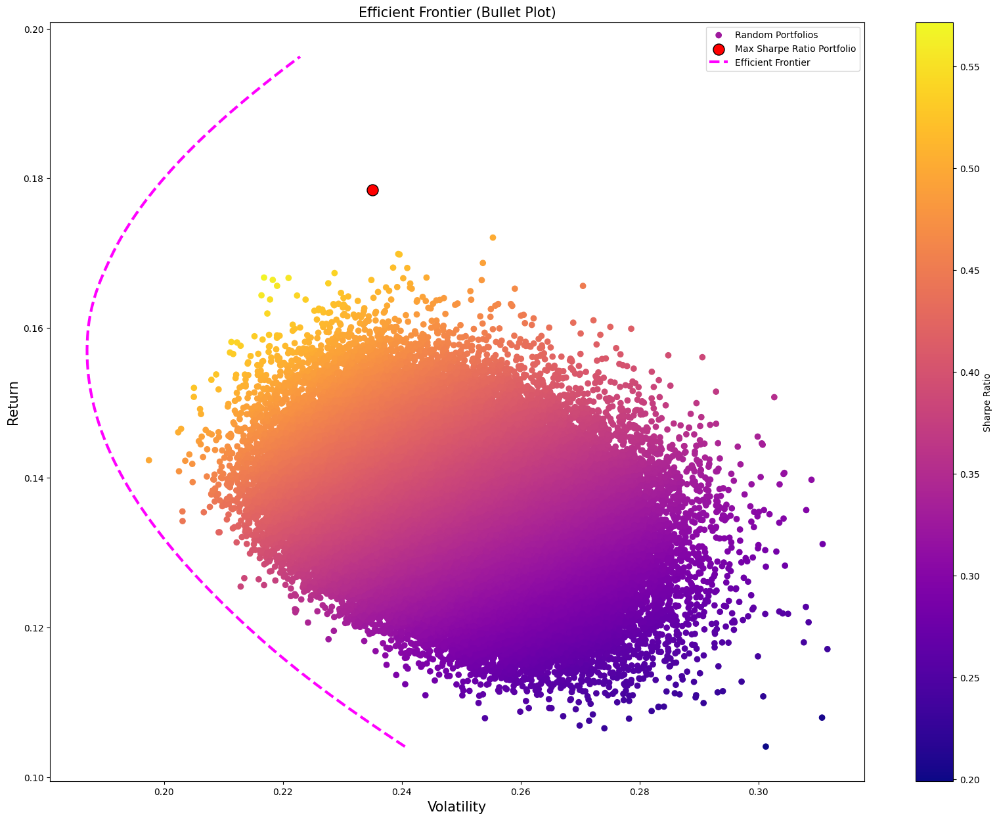

In [ ]:
# function to minimize volatility
def minimize_volatility(weights_fs):
    return np.sqrt(weights_fs.T.dot(252 * log_returns_fs.cov().dot(weights_fs)))

# range of target_returns to efficient frontier
target_returns_fs = np.linspace(port_return_fs.min(), port_return_fs.max() * 1.1, 100)

# Comuputation of efficient frontier
efficient_volatilities_fs = []
for target_return_fs in target_returns_fs:
    # Constraints: sum of weights = 1 and return = target_return
    constraints_fs = [
        {'type': 'eq', 'fun': lambda w: np.sum(w) - 1},  # somma dei pesi = 1
        {'type': 'eq', 'fun': lambda w: log_returns_fs.mean().dot(w) * 252 - target_return_fs}  # rendimento target
    ]
    bounds_fs = [(0, 1) for _ in range(len(data_fs.columns))]  # ogni peso tra 0 e 1
    initial_guess_fs = np.ones(len(data_fs.columns)) / len(data_fs.columns)  # pesi iniziali uniformi

    # Minimizza la volatilità per il rendimento target
    result_fs = minimize(minimize_volatility, initial_guess_fs, method='SLSQP', bounds=bounds_fs, constraints=constraints_fs)
    efficient_volatilities_fs.append(result_fs.fun)

plt.figure(figsize=(20, 15))
plt.scatter(port_volatility_fs, port_return_fs, c=port_sr_fs, cmap='plasma', label='Random Portfolios')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier (Bullet Plot)', fontsize=15)
plt.scatter(max_sr_vol_fs, max_sr_ret_fs, c='red', s=150, edgecolors='black', marker='o', label='Max Sharpe Ratio Portfolio')
plt.plot(efficient_volatilities_fs, target_returns_fs, c='magenta', linestyle='--', linewidth=3, label='Efficient Frontier')
plt.legend()
plt.show()


## Approach 2 - Optimization Problem

### Returns and Covariance

In [ ]:
# Annualized mean log return
log_returns_mean_fs = log_returns_fs.mean()*252

# Annualized covariance matrix
cov_fs = log_returns_fs.cov()*252

### Functions

In [ ]:
# Function to get return, volatility and Sharpe Ratio (Benchmark-Based Sharpe Ratio)
def get_ret_vol_sr(weights_fs):
    weights_fs = np.array(weights_fs)  # weights to a NumPy array
    ret_fs = log_returns_mean_fs.dot(weights_fs)  # expected portfolio return
    vol_fs = np.sqrt(weights_fs.T.dot(cov_fs.dot(weights_fs)))  # portfolio volatility
    sr_fs = (ret_fs - rf) / vol_fs  # Benchmark-Based Sharpe Ratio
    return np.array([ret_fs, vol_fs, sr_fs])  # Returns return, volatility, and the Sharpe Ratio


# Negative Sharpe ratio as we need to max it but Scipy minimize the given function
def neg_sr(weights_fs):
    return get_ret_vol_sr(weights_fs)[-1] * -1  # Returns the negative of the Sharpe Ratio


# check sum of weights
def check_sum(weights_fs):
    return np.sum(weights_fs) - 1  # Returns the difference between the sum of weights and 1 (Obviously it should be 0)


# Constraints for the optimization problem
cons_fs = {'type':'eq','fun':check_sum} # type = type of constraint
                                     # eq = equality
                                     # fun = function

# Bounds on weights (NON-NEGATIVITY)
bounds_fs = [(0, 1) for _ in range(10)]

# Initial guess for optimization to start with
init_guess_fs = [1/10 for _ in range(10)]  # it starts with 10% to each asset


# Call minimizer
opt_results_fs = optimize.minimize(neg_sr, init_guess_fs, constraints=cons_fs, bounds=bounds_fs, method='SLSQP') # SLSQP
                                                                                                    # (Sequential Least Squares Programming)

### Optimal Weights

In [ ]:
optimal_weights_fs = opt_results_fs.x
# optimal_weights
for st, i in zip(data_fs,optimal_weights_fs):
    print(f'Stock {st} has weight {np.round(i*100,2)} %')

Stock BANK OF AMERICA CORP has weight 0.0 %
Stock BERKSHIRE HATHAWAY B has weight 19.05 %
Stock COMMONWEALTH BANK OF AUS has weight 53.71 %
Stock GOLDMAN SACHS GROUP has weight 27.24 %
Stock HSBC HOLDINGS (GB) has weight 0.0 %
Stock JPMORGAN CHASE & CO has weight 0.0 %
Stock MASTERCARD A has weight 0.0 %
Stock ROYAL BANK OF CANADA has weight 0.0 %
Stock VISA A has weight 0.0 %
Stock WELLS FARGO & CO has weight 0.0 %


### Monte Carlo weights

In [ ]:
monte_c_weights_fs = port_weights_fs[ind_fs]
for st, i in zip(data_fs,monte_c_weights_fs):
    print(f'Stock {st} has weight {np.round(i*100,2)} %')

Stock BANK OF AMERICA CORP has weight 0.84 %
Stock BERKSHIRE HATHAWAY B has weight 4.79 %
Stock COMMONWEALTH BANK OF AUS has weight 37.08 %
Stock GOLDMAN SACHS GROUP has weight 33.2 %
Stock HSBC HOLDINGS (GB) has weight 0.26 %
Stock JPMORGAN CHASE & CO has weight 2.02 %
Stock MASTERCARD A has weight 1.36 %
Stock ROYAL BANK OF CANADA has weight 6.34 %
Stock VISA A has weight 3.03 %
Stock WELLS FARGO & CO has weight 11.09 %


### Comparison

In [ ]:
# Weights
(optimal_weights_fs - monte_c_weights_fs)

array([-0.00837525,  0.14258728,  0.16630205, -0.05954855, -0.00256049,
       -0.02016752, -0.01360042, -0.06338842, -0.03032042, -0.11092826])

In [ ]:
# Metrics of the portfolios
get_ret_vol_sr(optimal_weights_fs), get_ret_vol_sr(monte_c_weights_fs)

print('For a given portfolio we have: (Using Markowitz - SciPy)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(optimal_weights_fs)[i]}\n')
print("\n")
print('For a given portfolio we have: (Using Monte Carlo)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(monte_c_weights_fs)[i]}\n')

For a given portfolio we have: (Using Markowitz - SciPy)
 

Return is : 0.1892723056031749

Volatility is : 0.2118498940779727

SharpeRatio is : 0.685496229002793



For a given portfolio we have: (Using Monte Carlo)
 

Return is : 0.17841510723513962

Volatility is : 0.23507638689473154

SharpeRatio is : 0.5715806122085139



Let's save the optimal portfolio's metrics

In [ ]:
optimal_ret_fs, optimal_vol_fs, optimal_sr_fs = get_ret_vol_sr(optimal_weights_fs)
print(optimal_ret_fs, optimal_vol_fs, optimal_sr_fs)

0.1892723056031749 0.2118498940779727 0.685496229002793


### Efficient Frontier

In [ ]:
frontier_y_fs = np.linspace(port_return_fs.min(), port_return_fs.max() * 1.1, 100)
frontier_vol_fs = []

def minimize_vol(weights_fs):
    return get_ret_vol_sr(weights_fs)[1]

for possible_ret_fs in frontier_y_fs:
    cons_fs = ({'type':'eq','fun':check_sum},
            {'type':'eq','fun':lambda w:get_ret_vol_sr(w)[0] - possible_ret_fs})
    result_fs = optimize.minimize(minimize_vol, init_guess_fs, method='SLSQP', constraints=cons_fs, bounds=bounds_fs)
    frontier_vol_fs.append(result_fs['fun'])

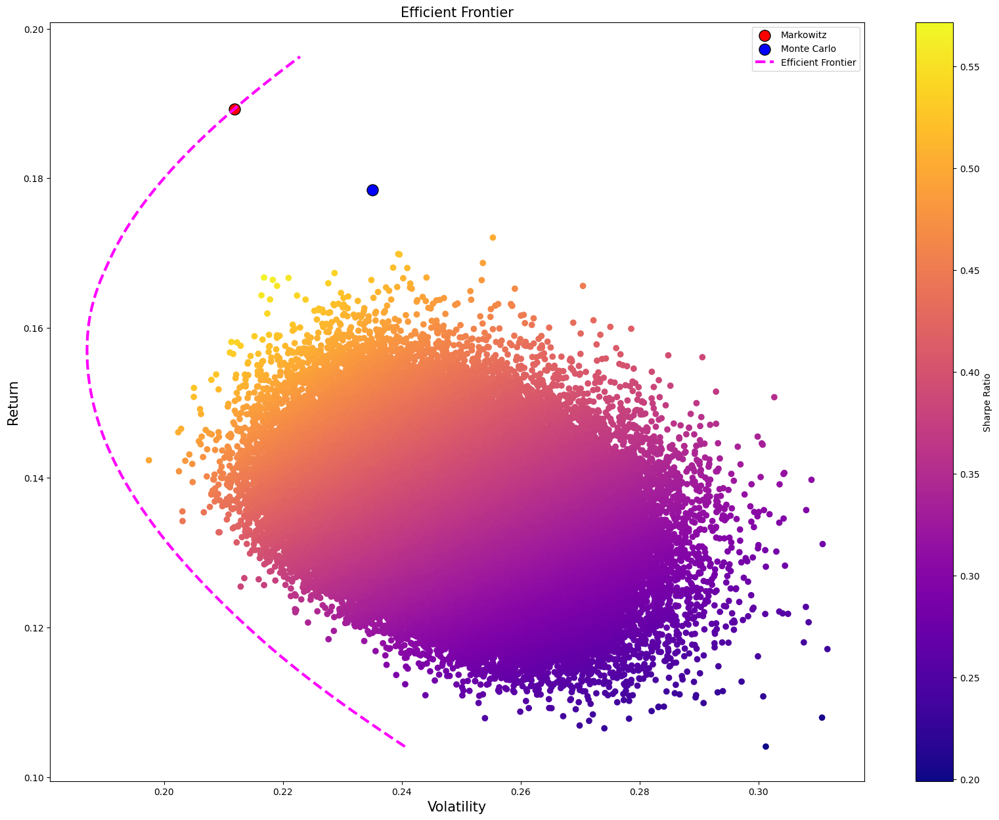

In [ ]:
plt.figure(figsize=(20,15))
plt.scatter(port_volatility_fs, port_return_fs, c=port_sr_fs, cmap='plasma')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier', fontsize=15)
plt.scatter(optimal_vol_fs, optimal_ret_fs, c='red', s=150, edgecolors='black', marker='o', label='Markowitz')
plt.scatter(max_sr_vol_fs, max_sr_ret_fs, c='blue', s=150, edgecolors='black', marker='o', label='Monte Carlo')
plt.plot(frontier_vol_fs, frontier_y_fs, c='magenta', ls='--', lw=3, label='Efficient Frontier')
plt.legend();
plt.savefig("grafico.png", dpi=300, bbox_inches='tight')

# 7. Energy Sector

## Data Processing

In [ ]:
#Tickers list
tickers_es = ["XOM", "CVX", "COP", "EOG","WMB", "EPD", "OKE", "KMI", "ET", "SLB"]

#Dict
ticker_name_es = {
    "XOM": "Exxon Mobil Corporation",
    "CVX": "Chevron Corporation",
    "COP": "ConocoPhillips",
    "EOG": "EOG Resources,",
    "WMB": "Williams Companies Inc.",
    "EPD": "Enterprise Products Partners",
    "OKE": "ONEOK",
    "KMI": "Kinder Morgan",
    "ET": "Energy Transfer",
    "SLB": "Schlumberger"
}

# Setting the dates
start_date = "2020-01-01"
end_date = datetime.today().strftime('%Y-%m-%d')

data_es = yf.download(tickers_es, start= start_date , end= end_date )['Adj Close']
print(data_es)

[*********************100%***********************]  10 of 10 completed

Ticker                            COP         CVX         EOG        EPD  \
Date                                                                       
2020-01-02 00:00:00+00:00   54.382130   97.225273   66.358421  18.947927   
2020-01-03 00:00:00+00:00   54.581516   96.888985   67.028786  19.129793   
2020-01-06 00:00:00+00:00   55.229511   96.560715   69.749695  19.331873   
2020-01-07 00:00:00+00:00   55.229511   95.327675   70.420052  19.345343   
2020-01-08 00:00:00+00:00   53.950127   94.238762   68.882156  19.291458   
...                               ...         ...         ...        ...   
2024-11-19 00:00:00+00:00  113.089996  159.600006  135.179993  31.629999   
2024-11-20 00:00:00+00:00  113.430000  161.330002  136.229996  31.790001   
2024-11-21 00:00:00+00:00  111.900002  161.630005  135.500000  32.349998   
2024-11-22 00:00:00+00:00  111.750000  162.360001  136.350006  32.820000   
2024-11-25 00:00:00+00:00  106.099998  160.360001  131.979996  32.340000   

Ticker     

In [ ]:
# Drop missing values
data_es = data_es.dropna()
# Verification (should give 0)
print(data_es.isna().sum())

Ticker
COP    0
CVX    0
EOG    0
EPD    0
ET     0
KMI    0
OKE    0
SLB    0
WMB    0
XOM    0
dtype: int64


In [ ]:
data_es = data_es.rename(columns={col: ticker_name_es[col] for col in data_es.columns if col in ticker_name_es})
print(data_es)

Ticker                     ConocoPhillips  Chevron Corporation  \
Date                                                             
2020-01-02 00:00:00+00:00       54.382130            97.225273   
2020-01-03 00:00:00+00:00       54.581516            96.888985   
2020-01-06 00:00:00+00:00       55.229511            96.560715   
2020-01-07 00:00:00+00:00       55.229511            95.327675   
2020-01-08 00:00:00+00:00       53.950127            94.238762   
...                                   ...                  ...   
2024-11-19 00:00:00+00:00      113.089996           159.600006   
2024-11-20 00:00:00+00:00      113.430000           161.330002   
2024-11-21 00:00:00+00:00      111.900002           161.630005   
2024-11-22 00:00:00+00:00      111.750000           162.360001   
2024-11-25 00:00:00+00:00      106.099998           160.360001   

Ticker                     EOG Resources,  Enterprise Products Partners  \
Date                                                              

## Final Dataset

In [ ]:
print(data_es.head())

Ticker                     ConocoPhillips  Chevron Corporation  \
Date                                                             
2020-01-02 00:00:00+00:00       54.382130            97.225273   
2020-01-03 00:00:00+00:00       54.581516            96.888985   
2020-01-06 00:00:00+00:00       55.229511            96.560715   
2020-01-07 00:00:00+00:00       55.229511            95.327675   
2020-01-08 00:00:00+00:00       53.950127            94.238762   

Ticker                     EOG Resources,  Enterprise Products Partners  \
Date                                                                      
2020-01-02 00:00:00+00:00       66.358421                     18.947927   
2020-01-03 00:00:00+00:00       67.028786                     19.129793   
2020-01-06 00:00:00+00:00       69.749695                     19.331873   
2020-01-07 00:00:00+00:00       70.420052                     19.345343   
2020-01-08 00:00:00+00:00       68.882156                     19.291458   

Ticker     

## Plots

### Adjusted Close

In [ ]:
data_df_es = data_es.reset_index() # index reset to include date column
data_df_es = data_df_es.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close")
fig = px.line(data_df_es, x="Date", y="Adjusted Close", color="Company",
              title="Adjusted Close Price Trends (Logarithmic Scale)")

fig.update_yaxes(type="log") # logarithmic scale
fig.show()

### Normalized Price

In [ ]:
# Let's normalize the data (Adj Close) in such a way we start from 100
normalized_data_es = data_es * 100 / data_es.iloc[0]

normalized_df_es = normalized_data_es.reset_index()  # index reset to include date column
normalized_df_es = normalized_df_es.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close (Normalized)")


fig = px.line(normalized_df_es, x="Date", y="Adjusted Close (Normalized)", color="Company",
              title="Adjusted Close Price Trends (Normalized)")
fig.show()

## Daily Log Returns

In [ ]:
# Log Returns
log_returns_es = np.log(data_es / data_es.shift(1))
log_returns_es = log_returns_es.dropna()

In [ ]:
log_returns_df_es = log_returns_es.reset_index()
log_returns_df_es = log_returns_df_es.melt(id_vars="Date", var_name="Company", value_name="Daily LogReturn")

fig = px.line(log_returns_df_es, x="Date", y="Daily LogReturn", color="Company",
              title="Daily LogReturns of Stocks")
fig.show()

## Approach 1 - Monte Carlo

### Risk-free rate

In [ ]:
ticker_rf = "^IRX"
rf_data = yf.download(ticker_rf, start=start_date, end=end_date)
print(rf_data)
rf = rf_data['Adj Close'].iloc[-1].values[0] / 100
print(f"Risk-free rate (rf) in decimal: {rf}")

[*********************100%***********************]  1 of 1 completed

Price                     Adj Close  Close   High    Low   Open Volume
Ticker                         ^IRX   ^IRX   ^IRX   ^IRX   ^IRX   ^IRX
Date                                                                  
2020-01-02 00:00:00+00:00     1.495  1.495  1.510  1.495  1.510      0
2020-01-03 00:00:00+00:00     1.473  1.473  1.490  1.460  1.490      0
2020-01-06 00:00:00+00:00     1.488  1.488  1.490  1.475  1.478      0
2020-01-07 00:00:00+00:00     1.500  1.500  1.505  1.500  1.505      0
2020-01-08 00:00:00+00:00     1.493  1.493  1.493  1.485  1.493      0
...                             ...    ...    ...    ...    ...    ...
2024-11-19 00:00:00+00:00     4.408  4.408  4.410  4.403  4.408      0
2024-11-20 00:00:00+00:00     4.410  4.410  4.415  4.410  4.410      0
2024-11-21 00:00:00+00:00     4.413  4.413  4.413  4.400  4.403      0
2024-11-22 00:00:00+00:00     4.415  4.415  4.420  4.408  4.408      0
2024-11-25 00:00:00+00:00     4.405  4.405  4.413  4.403  4.413      0

[1234

### Monte Carlo Simulation

In [ ]:
np.random.seed(1) # set seed for reproducibility

# number of simulations
n = 100_000

#Initialize variables
port_weights_es = np.zeros(shape=(n,len(data_es.columns)))
port_volatility_es = np.zeros(n)
port_sr_es = np.zeros(n)
port_return_es = np.zeros(n)
nume_securities_es = len(data_es.columns)

# generation of random portfolios with random normalized weights (sum to 1)
for i in range(n):
    # Weight each security
    weights_es = np.random.random(len(data_es.columns)) # np.random.random only produces non-negative values
    # normalize it, so that sum is one
    weights_es /= np.sum(weights_es)
    port_weights_es[i,:] = weights_es


    # Calculation of the annualized expected return
    exp_ret_es = log_returns_es.mean().dot(weights_es) * 252
    port_return_es[i] = exp_ret_es # save this value in the port_return array at position i, corresponding to the current simulation.

    # Annualized expected volatility
    exp_vol_es = np.sqrt(weights_es.T.dot(252 * log_returns_es.cov().dot(weights_es)))
    port_volatility_es[i] = exp_vol_es

    # Sharpe Ratio
    sr_es = (exp_ret_es - rf) / exp_vol_es
    port_sr_es[i] = sr_es

### Identification of the best portfolio

In [ ]:
# Index of max Sharpe Ratio
max_sr_es = port_sr_es.max()
ind_es = port_sr_es.argmax()
# Return and Volatility at Max SR
max_sr_ret_es = port_return_es[ind_es]
max_sr_vol_es = port_volatility_es[ind_es]

### Monte Carlo Weights

In [ ]:
# Weights
for weight_es, stock_es in sorted(zip(port_weights_es[ind_es], data_es)):
    print(f'{round(weight_es * 100, 2)} % of {stock_es} should be bought.')

print(f'\nMonte Carlo portfolio return is : {round(max_sr_ret_es * 100, 2)}% with volatility {max_sr_vol_es}')

0.12 % of Kinder Morgan should be bought.
0.2 % of Enterprise Products Partners should be bought.
0.91 % of ConocoPhillips should be bought.
3.85 % of ONEOK should be bought.
6.66 % of Schlumberger should be bought.
6.88 % of Exxon Mobil Corporation should be bought.
8.4 % of Chevron Corporation should be bought.
10.74 % of EOG Resources, should be bought.
11.04 % of Energy Transfer should be bought.
51.2 % of Williams Companies Inc. should be bought.

Monte Carlo portfolio return is : 18.76% with volatility 0.3455768547486279


### Monte Carlo Efficient Frontier

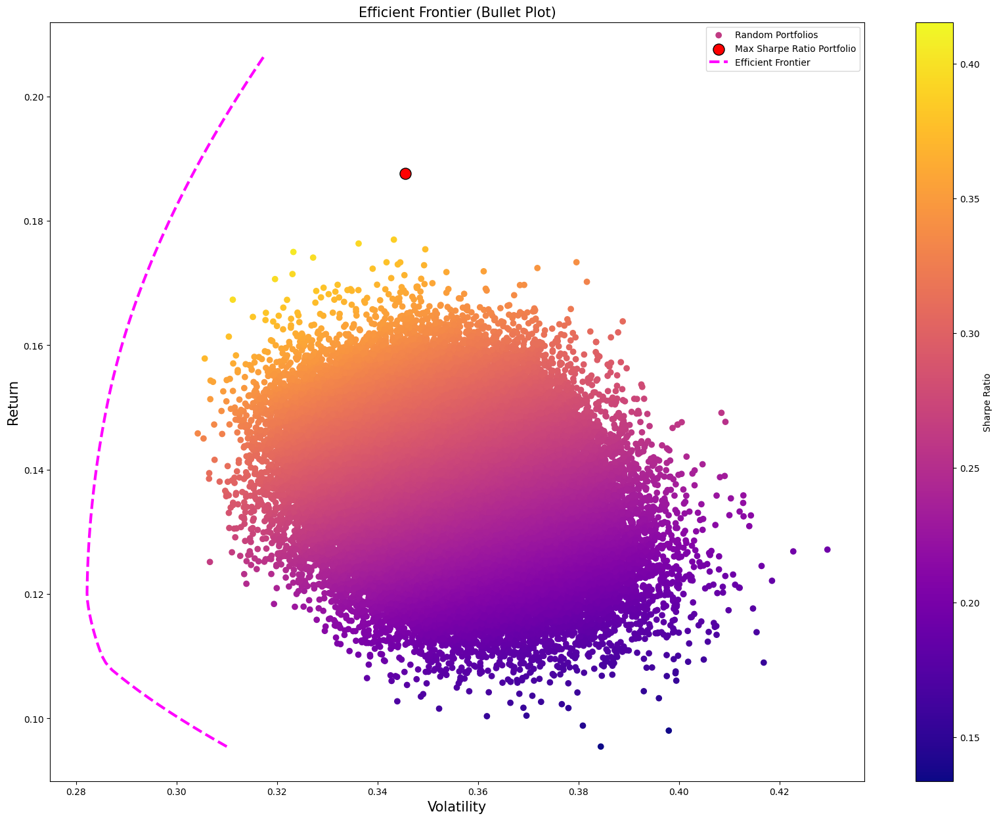

In [ ]:
# function to minimize volatility
def minimize_volatility(weights_es):
    return np.sqrt(weights_es.T.dot(252 * log_returns_es.cov().dot(weights_es)))

# range of target_returns to efficient frontier
target_returns_es = np.linspace(port_return_es.min(), port_return_es.max()*1.1, 100)

# Comuputation of efficient frontier
efficient_volatilities_es = []
for target_return_es in target_returns_es:
    # Constraints: sum of weights = 1 and return = target_return
    constraints_es = [
        {'type': 'eq', 'fun': lambda w: np.sum(w) - 1},  # sum of weights = 1
        {'type': 'eq', 'fun': lambda w: log_returns_es.mean().dot(w) * 252 - target_return_es}  # target return
    ]
    bounds_es = [(0, 1) for _ in range(len(data_es.columns))]  # ogni peso tra 0 e 1
    initial_guess_es = np.ones(len(data_es.columns)) / len(data_es.columns)

    # Minimize volatility for the target return
    result_es = minimize(minimize_volatility, initial_guess_es, method='SLSQP', bounds=bounds_es, constraints=constraints_es)
    efficient_volatilities_es.append(result_es.fun)

plt.figure(figsize=(20, 15))
plt.scatter(port_volatility_es, port_return_es, c=port_sr_es, cmap='plasma', label='Random Portfolios')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier (Bullet Plot)', fontsize=15)
plt.scatter(max_sr_vol_es, max_sr_ret_es, c='red', s=150, edgecolors='black', marker='o', label='Max Sharpe Ratio Portfolio')
plt.plot(efficient_volatilities_es, target_returns_es, c='magenta', linestyle='--', linewidth=3, label='Efficient Frontier')
plt.legend()
plt.show()


## Approach 2 - Optimization Problem

### Returns and Covariance

In [ ]:
# Annualized mean log return
log_returns_mean_es = log_returns_es.mean()*252

# Annualized covariance matrix
cov_es = log_returns_es.cov()*252

### Functions

In [ ]:
# Function to get return, volatility and Sharpe Ratio
def get_ret_vol_sr(weights_es):
    weights_es = np.array(weights_es)  # weights to a NumPy array
    ret_es = log_returns_mean_es.dot(weights_es)  # expected portfolio return
    vol_es = np.sqrt(weights_es.T.dot(cov_es.dot(weights_es)))  # portfolio volatility
    sr_es = (ret_es - rf) / vol_es  # Sharpe Ratio
    return np.array([ret_es, vol_es, sr_es])  # Returns return, volatility, and the Sharpe Ratio


# Negative Sharpe ratio as we need to max it but Scipy minimize the given function
def neg_sr(weights_es):
    return get_ret_vol_sr(weights_es)[-1] * -1  # Returns the negative of the Sharpe Ratio


# check sum of weights
def check_sum(weights_es):
    return np.sum(weights_es) - 1  # Returns the difference between the sum of weights and 1 (Obviously it should be 0)


# Constraints for the optimization problem
cons_es = {'type':'eq','fun':check_sum} # type = type of constraint
                                     # eq = equality
                                     # fun = function

# Bounds on weights (NON-NEGATIVITY)
bounds_es = [(0, 1) for _ in range(10)]

# Initial guess for optimization to start with
init_guess_es = [1/10 for _ in range(10)]  # it starts with 10% to each asset


# Call minimizer
opt_results_es = optimize.minimize(neg_sr, init_guess_es, constraints=cons_es, bounds=bounds_es, method='SLSQP') # SLSQP
                                                                                                    # (Sequential Least Squares Programming)



### Optimal Weights

In [ ]:
optimal_weights_es = opt_results_es.x
# optimal_weights
for st, i in sorted(zip(data_es,optimal_weights_es)):
    print(f'Stock {st} has weight {np.round(i*100,2)} %')

Stock Chevron Corporation has weight 0.0 %
Stock ConocoPhillips has weight 0.0 %
Stock EOG Resources, has weight 0.0 %
Stock Energy Transfer has weight 0.0 %
Stock Enterprise Products Partners has weight 0.0 %
Stock Exxon Mobil Corporation has weight 0.0 %
Stock Kinder Morgan has weight 0.0 %
Stock ONEOK has weight 0.0 %
Stock Schlumberger has weight 0.0 %
Stock Williams Companies Inc. has weight 100.0 %


### Monte Carlo weights

In [ ]:
monte_c_weights_es = port_weights_es[ind_es]
for st, i in sorted(zip(data_es,monte_c_weights_es)):
    print(f'Stock {st} has weight {np.round(i*100,2)} %')

Stock Chevron Corporation has weight 8.4 %
Stock ConocoPhillips has weight 0.91 %
Stock EOG Resources, has weight 10.74 %
Stock Energy Transfer has weight 11.04 %
Stock Enterprise Products Partners has weight 0.2 %
Stock Exxon Mobil Corporation has weight 6.88 %
Stock Kinder Morgan has weight 0.12 %
Stock ONEOK has weight 3.85 %
Stock Schlumberger has weight 6.66 %
Stock Williams Companies Inc. has weight 51.2 %


### Comparison and metrics

In [ ]:
# Metrics of the portfolios
get_ret_vol_sr(optimal_weights_es), get_ret_vol_sr(monte_c_weights_es)

print('For a given portfolio we have: (Using Markowitz - SciPy)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(optimal_weights_es)[i]}\n')
print("\n")
print('For a given portfolio we have: (Using Monte Carlo)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(monte_c_weights_es)[i]}\n')

For a given portfolio we have: (Using Markowitz - SciPy)
 

Return is : 0.24390270933462732

Volatility is : 0.35756417137002044

SharpeRatio is : 0.5589282239067767



For a given portfolio we have: (Using Monte Carlo)
 

Return is : 0.1876335670238803

Volatility is : 0.3455768547486279

SharpeRatio is : 0.41548952990569715



In [ ]:
optimal_ret_es, optimal_vol_es, optimal_sr_es = get_ret_vol_sr(optimal_weights_es)
print(optimal_ret_es, optimal_vol_es, optimal_sr_es)

0.24390270933462732 0.35756417137002044 0.5589282239067767


### Efficient Frontier

In [ ]:
frontier_y_es = np.linspace(port_return_es.min(), port_return_es.max() * 1.3, 100)
frontier_vol_es = []

def minimize_vol(weights_es):
    return get_ret_vol_sr(weights_es)[1]

for possible_ret in frontier_y_es:
    cons_es = (
        {'type': 'eq', 'fun': check_sum},
        {'type': 'eq', 'fun': lambda w: get_ret_vol_sr(w)[0] - possible_ret})
    result_es = optimize.minimize(minimize_vol,init_guess_es,method='SLSQP',constraints=cons_es,bounds=bounds_es)
    frontier_vol_es.append(result_es['fun'])


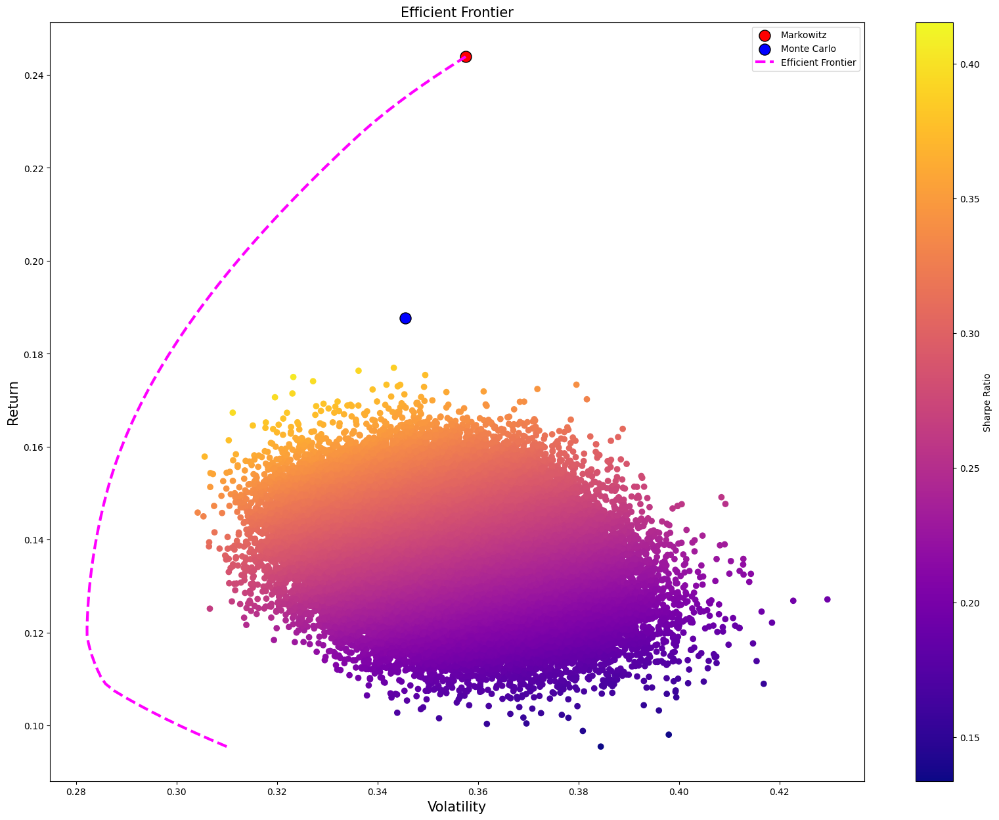

In [ ]:
plt.figure(figsize=(20, 15))
plt.scatter(port_volatility_es, port_return_es, c=port_sr_es, cmap='plasma')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier', fontsize=15)
plt.scatter(optimal_vol_es, optimal_ret_es, c='red', s=150, edgecolors='black', marker='o', label='Markowitz')
plt.scatter(max_sr_vol_es, max_sr_ret_es, c='blue', s=150, edgecolors='black', marker='o', label='Monte Carlo')
plt.plot(frontier_vol_es, frontier_y_es, c='magenta', ls='--', lw=3, label='Efficient Frontier')
plt.legend()
plt.show()


# 8. Technology Sector

## Data Processing

In [ ]:
# Tickers list
tickers_ts = ["NVDA", "AAPL", "MSFT", "AMZN", "GOOG", "META", "TSLA", "CRM", "AMD", "BABA"]

# Dictionary to store stocks' name
ticker_name_ts = {
    "NVDA": "NVIDIA",
    "AAPL": "APPLE",
    "MSFT": "MICROSOFT",
    "AMZN": "AMAZON",
    "GOOG": "GOOGLE",
    "META": "META",
    "TSLA": "TESLA",
    "CRM": "SALESFORCE",
    "AMD": "AMD",
    "BABA": "ALIBABA"
}

# Setting the dates
start_date = "2020-01-01"
end_date = datetime.today().strftime('%Y-%m-%d')

# Importing the data
data_ts = yf.download(tickers_ts, start=start_date, end=end_date)["Adj Close"]
print(data_ts)

[*********************100%***********************]  10 of 10 completed

Ticker                           AAPL         AMD        AMZN        BABA  \
Date                                                                        
2020-01-02 00:00:00+00:00   72.795998   49.099998   94.900497  212.242126   
2020-01-03 00:00:00+00:00   72.088295   48.599998   93.748497  209.567017   
2020-01-06 00:00:00+00:00   72.662720   48.389999   95.143997  209.219345   
2020-01-07 00:00:00+00:00   72.320976   48.250000   95.343002  210.175446   
2020-01-08 00:00:00+00:00   73.484344   47.830002   94.598503  210.532761   
...                               ...         ...         ...         ...   
2024-11-19 00:00:00+00:00  228.279999  139.389999  204.610001   87.110001   
2024-11-20 00:00:00+00:00  229.000000  137.600006  202.880005   86.769997   
2024-11-21 00:00:00+00:00  228.520004  137.490005  198.380005   85.580002   
2024-11-22 00:00:00+00:00  229.869995  138.350006  197.119995   83.129997   
2024-11-25 00:00:00+00:00  232.869995  141.130005  201.449997   85.580002   

In [ ]:
# Drop missing values
data_ts = data_ts.dropna()
# Verification (should give 0)
print(data_ts.isna().sum())

Ticker
AAPL    0
AMD     0
AMZN    0
BABA    0
CRM     0
GOOG    0
META    0
MSFT    0
NVDA    0
TSLA    0
dtype: int64


In [ ]:
data_ts = data_ts.rename(columns={col: ticker_name_ts[col] for col in data_ts.columns if col in ticker_name_ts})
print(data_ts)

Ticker                          APPLE         AMD      AMAZON     ALIBABA  \
Date                                                                        
2020-01-02 00:00:00+00:00   72.795998   49.099998   94.900497  212.242126   
2020-01-03 00:00:00+00:00   72.088295   48.599998   93.748497  209.567017   
2020-01-06 00:00:00+00:00   72.662720   48.389999   95.143997  209.219345   
2020-01-07 00:00:00+00:00   72.320976   48.250000   95.343002  210.175446   
2020-01-08 00:00:00+00:00   73.484344   47.830002   94.598503  210.532761   
...                               ...         ...         ...         ...   
2024-11-19 00:00:00+00:00  228.279999  139.389999  204.610001   87.110001   
2024-11-20 00:00:00+00:00  229.000000  137.600006  202.880005   86.769997   
2024-11-21 00:00:00+00:00  228.520004  137.490005  198.380005   85.580002   
2024-11-22 00:00:00+00:00  229.869995  138.350006  197.119995   83.129997   
2024-11-25 00:00:00+00:00  232.869995  141.130005  201.449997   85.580002   

## Final Dataset

In [ ]:
print(data_ts.head())

Ticker                         APPLE        AMD     AMAZON     ALIBABA  \
Date                                                                     
2020-01-02 00:00:00+00:00  72.795998  49.099998  94.900497  212.242126   
2020-01-03 00:00:00+00:00  72.088295  48.599998  93.748497  209.567017   
2020-01-06 00:00:00+00:00  72.662720  48.389999  95.143997  209.219345   
2020-01-07 00:00:00+00:00  72.320976  48.250000  95.343002  210.175446   
2020-01-08 00:00:00+00:00  73.484344  47.830002  94.598503  210.532761   

Ticker                     SALESFORCE     GOOGLE        META   MICROSOFT  \
Date                                                                       
2020-01-02 00:00:00+00:00  166.251953  68.201012  209.150269  153.630737   
2020-01-03 00:00:00+00:00  165.435577  67.866325  208.043610  151.717743   
2020-01-06 00:00:00+00:00  172.683395  69.539726  211.961807  152.109894   
2020-01-07 00:00:00+00:00  175.222137  69.496330  212.420410  150.722946   
2020-01-08 00:00:00+00:00

## Plots

### Adjusted Close

In [ ]:
data_df_ts = data_ts.reset_index() # index reset to include date column
data_df_ts = data_df_ts.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close")
fig = px.line(data_df_ts, x="Date", y="Adjusted Close", color="Company",
              title="Adjusted Close Price Trends (Logarithmic Scale)")

fig.update_yaxes(type="log") # logarithmic scale
fig.show()

### Normalized Price

In [ ]:
# Let's normalize the data (Adj Close) in such a way we start from 100
normalized_data_ts = data_ts * 100 / data_ts.iloc[0]

normalized_df_ts = normalized_data_ts.reset_index()  # index reset to include date column
normalized_df_ts = normalized_df_ts.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close (Normalized)")


fig = px.line(normalized_df_ts, x="Date", y="Adjusted Close (Normalized)", color="Company",
              title="Adjusted Close Price Trends (Normalized)")
fig.show()

## Daily Log Returns

In [ ]:
# Log Returns
log_returns_ts = np.log(data_ts / data_ts.shift(1))
log_returns_ts = log_returns_ts.dropna()

In [ ]:
log_returns_df_ts = log_returns_ts.reset_index()  # index reset to include date column
log_returns_df_ts = log_returns_df_ts.melt(id_vars="Date", var_name="Company", value_name="Daily LogReturn")

fig = px.line(log_returns_df_ts, x="Date", y="Daily LogReturn", color="Company",
              title="Daily LogReturns of Stocks")
fig.show()

## Approach 1- Monte Carlo

### Risk-free Rrte

In [ ]:
ticker_rf = "^IRX"
rf_data = yf.download(ticker_rf, start=start_date, end=end_date)
print(rf_data)
rf = rf_data['Adj Close'].iloc[-1].values[0] / 100
print(f"Risk-free rate (rf) in decimal: {rf}")

[*********************100%***********************]  1 of 1 completed

Price                     Adj Close  Close   High    Low   Open Volume
Ticker                         ^IRX   ^IRX   ^IRX   ^IRX   ^IRX   ^IRX
Date                                                                  
2020-01-02 00:00:00+00:00     1.495  1.495  1.510  1.495  1.510      0
2020-01-03 00:00:00+00:00     1.473  1.473  1.490  1.460  1.490      0
2020-01-06 00:00:00+00:00     1.488  1.488  1.490  1.475  1.478      0
2020-01-07 00:00:00+00:00     1.500  1.500  1.505  1.500  1.505      0
2020-01-08 00:00:00+00:00     1.493  1.493  1.493  1.485  1.493      0
...                             ...    ...    ...    ...    ...    ...
2024-11-19 00:00:00+00:00     4.408  4.408  4.410  4.403  4.408      0
2024-11-20 00:00:00+00:00     4.410  4.410  4.415  4.410  4.410      0
2024-11-21 00:00:00+00:00     4.413  4.413  4.413  4.400  4.403      0
2024-11-22 00:00:00+00:00     4.415  4.415  4.420  4.408  4.408      0
2024-11-25 00:00:00+00:00     4.405  4.405  4.413  4.403  4.413      0

[1234

### Monte Carlo Simulation

In [ ]:
np.random.seed(1) # set seed for reproducibility

# number of simulations
n = 100_000 # it could take some minutes

port_weights_ts = np.zeros(shape=(n,len(data_ts.columns)))
port_volatility_ts = np.zeros(n)
port_sr_ts = np.zeros(n)
port_return_ts = np.zeros(n)
nume_securities_ts = len(data_ts.columns)

# generation of random portfolios with random normalized weights (sum to 1)
for i in range(n):
    # Weight each security
    weights_ts = np.random.random(len(data_ts.columns)) # np.random.random only produces non-negative values
    # normalize it, so that sum is one
    weights_ts /= np.sum(weights_ts)
    port_weights_ts[i,:] = weights_ts # 'i' indicates the specific iteration (i.e. the current portfolio in the simulation).
                                # ':' indicates that we are saving all the weights generated for this portfolio (i.e. for each security)

    # Calculation of the annualized expected return
    exp_ret_ts = log_returns_ts.mean().dot(weights_ts) * 252
    port_return_ts[i] = exp_ret_ts # save this value in the port_return array at position i, corresponding to the current simulation.

    # Annualized expected volatility
    exp_vol_ts = np.sqrt(weights_ts.T.dot(252 * log_returns_ts.cov().dot(weights_ts)))
    port_volatility_ts[i] = exp_vol_ts

    # Sharpe Ratio
    sr_ts = (exp_ret_ts - rf) / exp_vol_ts
    port_sr_ts[i] = sr_ts

### Identification of the best portfolio

In [ ]:
# Index of max Sharpe Ratio
max_sr_ts = port_sr_ts.max()
ind_ts = port_sr_ts.argmax()

# Return and Volatility at Max SR
max_sr_ret_ts = port_return_ts[ind_ts]
max_sr_vol_ts = port_volatility_ts[ind_ts]

### Monte Carlo Weights

In [ ]:
for weight, stock in sorted(zip(port_weights_ts[ind_ts], data_ts.columns), key=lambda x: x[0], reverse=True):
    print(f'{round(weight * 100, 2)} % of {stock} should be bought.')

print(f'\nMonte Carlo portfolio return is : {round(max_sr_ret_ts * 100, 2)}% with volatility {max_sr_vol_ts} and Sharpe Ratio {max_sr_ts}')

51.2 % of NVIDIA should be bought.
11.04 % of SALESFORCE should be bought.
10.74 % of AMAZON should be bought.
8.4 % of AMD should be bought.
6.88 % of TESLA should be bought.
6.66 % of MICROSOFT should be bought.
3.85 % of META should be bought.
0.91 % of APPLE should be bought.
0.2 % of ALIBABA should be bought.
0.12 % of GOOGLE should be bought.

Monte Carlo portfolio return is : 43.6% with volatility 0.41792222819928737 and Sharpe Ratio 0.9378331027308558


### Monte Carlo Efficient Frontier

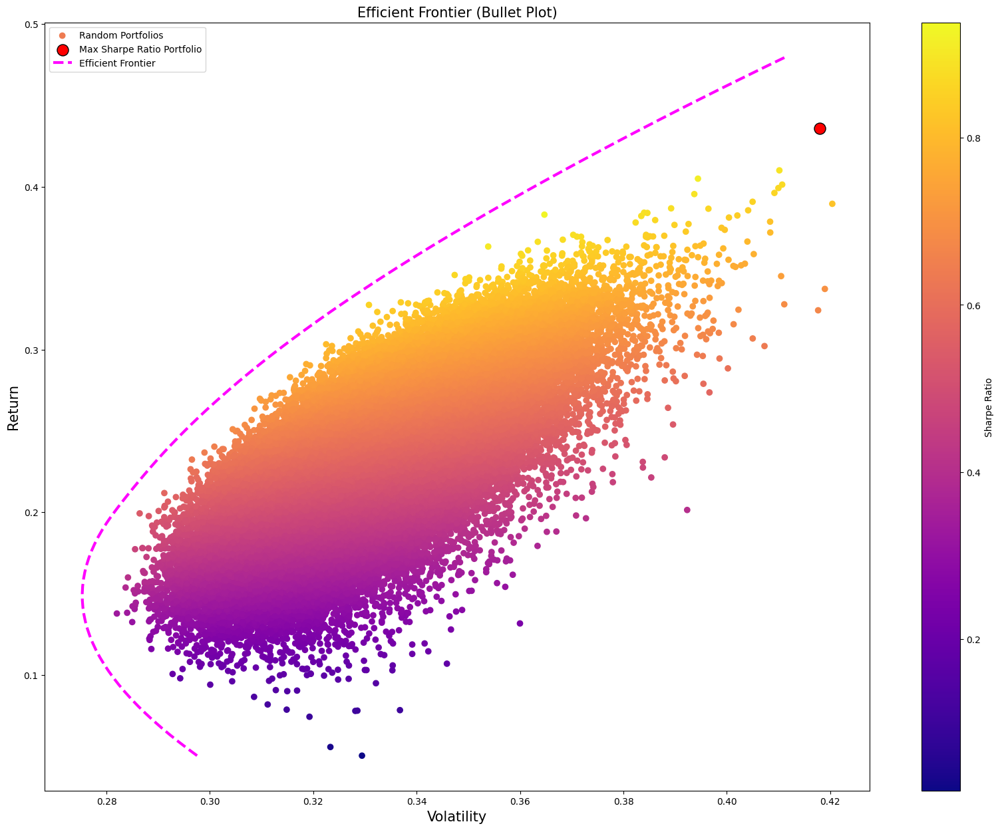

In [ ]:
# function to minimize volatility
def minimize_volatility(weights_ts):
    return np.sqrt(weights_ts.T.dot(252 * log_returns_ts.cov().dot(weights_ts)))

# range of target_returns to efficient frontier
target_returns_ts = np.linspace(port_return_ts.min(), port_return_ts.max() * 1.1, 100)

# Comuputation of efficient frontier
efficient_volatilities_ts = []
for target_return_ts in target_returns_ts:
    # Constraints: sum of weights = 1 and return = target_return
    constraints_ts = [
        {'type': 'eq', 'fun': lambda w: np.sum(w) - 1},  # sum of weights = 1
        {'type': 'eq', 'fun': lambda w: log_returns_ts.mean().dot(w) * 252 - target_return_ts}  # target return
    ]
    bounds_ts = [(0, 1) for _ in range(len(data_ts.columns))]  # weights between 0 ans 1
    initial_guess_ts = np.ones(len(data_ts.columns)) / len(data_ts.columns)  # uniform initial weights

    # minimizing volatility and target returns
    result_ts = minimize(minimize_volatility, initial_guess_ts, method='SLSQP', bounds=bounds_ts, constraints=constraints_ts)
    efficient_volatilities_ts.append(result_ts.fun)

plt.figure(figsize=(20, 15))
plt.scatter(port_volatility_ts, port_return_ts, c=port_sr_ts, cmap='plasma', label='Random Portfolios')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier (Bullet Plot)', fontsize=15)
plt.scatter(max_sr_vol_ts, max_sr_ret_ts, c='red', s=150, edgecolors='black', marker='o', label='Max Sharpe Ratio Portfolio')
plt.plot(efficient_volatilities_ts, target_returns_ts, c='magenta', linestyle='--', linewidth=3, label='Efficient Frontier')
plt.legend()
plt.show()


## Approach 2 - Optimization Problem

### Returns and Covariance

In [ ]:
# Annualized mean log return
log_returns_mean_ts = log_returns_ts.mean()*252

# Annualized covariance matrix
cov_ts = log_returns_ts.cov()*252

### Functions

In [ ]:
# Function to get return, volatility and Sharpe Ratio (Benchmark-Based Sharpe Ratio)
def get_ret_vol_sr(weights_ts):
    weights_ts = np.array(weights_ts)  # weights to a NumPy array
    ret_ts = log_returns_mean_ts.dot(weights_ts)  # expected portfolio return
    vol_ts = np.sqrt(weights_ts.T.dot(cov_ts.dot(weights_ts)))  # portfolio volatility
    sr_ts = (ret_ts - rf) / vol_ts  # Benchmark-Based Sharpe Ratio
    return np.array([ret_ts, vol_ts, sr_ts])  # Returns return, volatility, and the Sharpe Ratio


# Negative Sharpe ratio as we need to max it but Scipy minimize the given function
def neg_sr(weights_ts):
    return get_ret_vol_sr(weights_ts)[-1] * -1  # Returns the negative of the Sharpe Ratio


# check sum of weights
def check_sum(weights_ts):
    return np.sum(weights_ts) - 1  # Returns the difference between the sum of weights and 1 (Obviously it should be 0)


# Constraints for the optimization problem
cons_ts = {'type':'eq','fun':check_sum} # type = type of constraint
                                     # eq = equality
                                     # fun = function

# Bounds on weights (NON-NEGATIVITY)
bounds_ts = [(0, 1) for _ in range(10)]

# Initial guess for optimization to start with
init_guess_ts = [1/10 for _ in range(10)]  # it starts with 10% to each asset


# Call minimizer
opt_results_ts = optimize.minimize(neg_sr, init_guess_ts, constraints=cons_ts, bounds=bounds_ts, method='SLSQP') # SLSQP
                                                                                                    # (Sequential Least Squares Programming)


### Optimal Weights

In [ ]:
# Optimal weights
optimal_weights_ts = opt_results_ts.x
# Stampa l'output ordinato in base ai pesi
for st, weight in sorted(zip(data_ts, np.round(optimal_weights_ts * 100, 2)), key=lambda x: x[1], reverse=True):
    print(f'Stock {st} has weight {weight} %')


Stock NVIDIA has weight 86.26 %
Stock TESLA has weight 13.74 %
Stock APPLE has weight 0.0 %
Stock AMD has weight 0.0 %
Stock AMAZON has weight 0.0 %
Stock ALIBABA has weight 0.0 %
Stock SALESFORCE has weight 0.0 %
Stock GOOGLE has weight 0.0 %
Stock META has weight 0.0 %
Stock MICROSOFT has weight 0.0 %


### Monte Carlo Weights

In [ ]:
monte_c_weights_ts = port_weights_ts[ind_ts]
for st, weight in sorted(zip(data_ts, np.round(monte_c_weights_ts * 100, 2)), key=lambda x: x[1], reverse=True):
    print(f'Stock {st} has weight {weight} %')

Stock NVIDIA has weight 51.2 %
Stock SALESFORCE has weight 11.04 %
Stock AMAZON has weight 10.74 %
Stock AMD has weight 8.4 %
Stock TESLA has weight 6.88 %
Stock MICROSOFT has weight 6.66 %
Stock META has weight 3.85 %
Stock APPLE has weight 0.91 %
Stock ALIBABA has weight 0.2 %
Stock GOOGLE has weight 0.12 %


### Comparison and metrics

In [ ]:
# Metrics of the portfolios
get_ret_vol_sr(optimal_weights_ts), get_ret_vol_sr(monte_c_weights_ts)

print('For a given portfolio we have: (Using Markowitz - SciPy)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(optimal_weights_ts)[i]}\n')
print("\n")
print('For a given portfolio we have: (Using Monte Carlo)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(monte_c_weights_ts)[i]}\n')

For a given portfolio we have: (Using Markowitz - SciPy)
 

Return is : 0.620340335724262

Volatility is : 0.5153004255467142

SharpeRatio is : 1.1183579617943382



For a given portfolio we have: (Using Monte Carlo)
 

Return is : 0.4359913020704139

Volatility is : 0.41792222819928737

SharpeRatio is : 0.9378331027308557



In [ ]:
optimal_ret_ts, optimal_vol_ts, optimal_sr_ts = get_ret_vol_sr(optimal_weights_ts)
print(optimal_ret_ts, optimal_vol_ts, optimal_sr_ts)

0.620340335724262 0.5153004255467142 1.1183579617943382


### Efficient Frontier

In [ ]:
# Efficient Frontier
frontier_y_ts = np.linspace(port_return_ts.min(), port_return_ts.max()*1.45, 100)
frontier_vol_ts = []

def minimize_vol(weights_ts):
    return get_ret_vol_sr(weights_ts)[1]

for possible_ret in frontier_y_ts:
    cons_ts = ({'type':'eq','fun':check_sum},
            {'type':'eq','fun':lambda w:get_ret_vol_sr(w)[0] - possible_ret})
    result_ts = optimize.minimize(minimize_vol, init_guess_ts, method='SLSQP', constraints=cons_ts, bounds=bounds_ts)
    frontier_vol_ts.append(result_ts['fun'])

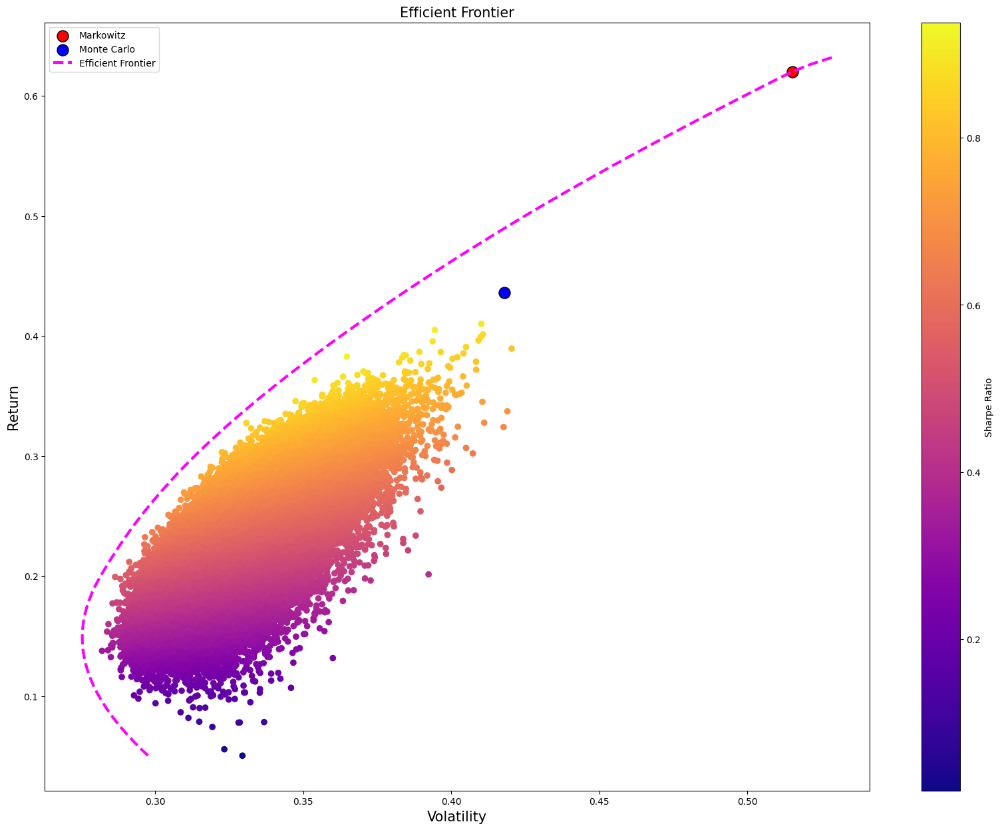

In [ ]:
plt.figure(figsize=(20, 15))
plt.scatter(port_volatility_ts, port_return_ts, c=port_sr_ts, cmap='plasma')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier', fontsize=15)
plt.scatter(optimal_vol_ts, optimal_ret_ts, c='red', s=150, edgecolors='black', marker='o', label='Markowitz')
plt.scatter(max_sr_vol_ts, max_sr_ret_ts, c='blue', s=150, edgecolors='black', marker='o', label='Monte Carlo')
plt.plot(frontier_vol_ts, frontier_y_ts, c='magenta', ls='--', lw=3, label='Efficient Frontier')
plt.legend()
plt.show()

# 9. Health Sector

## Data Processing


In [ ]:
# Tickers list
tickers_hs = ["JNJ", "PFE", "UNH", "ABBV", "MRK", "TMO", "LLY", "MDT", "AMGN", "GILD"]
# Dictionary to store stocks' name

ticker_name_hs = {
    "JNJ": "Johnson & Johnson",
    "PFE": "BPfizer Inc. ",
    "UNH": "UnitedHealth Group Incorporated",
    "ABBV": "MAbbVie Inc.",
    "MRK": "Merck & Co., Inc.",
    "TMO": "Thermo Fisher Scientific Inc.",
    "LLY": "REli Lilly and Company",
    "MDT": "Medtronic plc",
    "AMGN": "GAmgen Inc.",
    "GILD": "Gilead Sciences, Inc."
}
# Setting the dates
start_date = "2020-01-01"
end_date = datetime.today().strftime('%Y-%m-%d')

# Importing the data
data_hs = yf.download(tickers_hs, start= start_date , end= end_date )['Adj Close']
print(data_hs)

[*********************100%***********************]  10 of 10 completed


Ticker                           ABBV        AMGN       GILD         JNJ  \
Date                                                                       
2020-01-02 00:00:00+00:00   72.264893  206.104706  53.628292  128.083755   
2020-01-03 00:00:00+00:00   71.578941  204.705490  53.496742  126.600807   
2020-01-06 00:00:00+00:00   72.143822  206.276382  53.973595  126.442894   
2020-01-07 00:00:00+00:00   71.732277  204.336349  53.537857  127.215012   
2020-01-08 00:00:00+00:00   72.240677  204.490906  54.096912  127.197479   
...                               ...         ...        ...         ...   
2024-11-19 00:00:00+00:00  166.570007  279.950012  87.750000  153.000000   
2024-11-20 00:00:00+00:00  167.759995  287.869995  88.629997  153.110001   
2024-11-21 00:00:00+00:00  171.729996  289.899994  89.760002  155.500000   
2024-11-22 00:00:00+00:00  176.949997  294.529999  90.190002  155.169998   
2024-11-25 00:00:00+00:00  177.059998  294.000000  90.489998  155.779999   

Ticker     

In [ ]:
# Drop missing values
data_hs = data_hs.dropna()
# Verification (should give 0)
print(data_hs.isna().sum())

Ticker
ABBV    0
AMGN    0
GILD    0
JNJ     0
LLY     0
MDT     0
MRK     0
PFE     0
TMO     0
UNH     0
dtype: int64


In [ ]:
data_hs = data_hs.rename(columns={col: ticker_name_hs[col] for col in data_hs.columns if col in ticker_name_hs})

## Final Dataset

In [ ]:
print(data_hs.head())

Ticker                     MAbbVie Inc.  GAmgen Inc.  Gilead Sciences, Inc.  \
Date                                                                          
2020-01-02 00:00:00+00:00     72.264893   206.104706              53.628292   
2020-01-03 00:00:00+00:00     71.578941   204.705490              53.496742   
2020-01-06 00:00:00+00:00     72.143822   206.276382              53.973595   
2020-01-07 00:00:00+00:00     71.732277   204.336349              53.537857   
2020-01-08 00:00:00+00:00     72.240677   204.490906              54.096912   

Ticker                     Johnson & Johnson  REli Lilly and Company  \
Date                                                                   
2020-01-02 00:00:00+00:00         128.083755              123.915451   
2020-01-03 00:00:00+00:00         126.600807              123.503120   
2020-01-06 00:00:00+00:00         126.442894              123.962341   
2020-01-07 00:00:00+00:00         127.215012              124.196663   
2020-01-08 00:

## Plots

### Adjusted Close

In [ ]:
data_df_hs = data_hs.reset_index() # index reset to include date column
data_df_hs = data_df_hs.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close")
fig = px.line(data_df_hs, x="Date", y="Adjusted Close", color="Company",
              title="Adjusted Close Price Trends (Logarithmic Scale)")

fig.update_yaxes(type="log") # logarithmic scale
fig.show()

### Normalized Prices

In [ ]:
# Let's normalize the data (Adj Close) in such a way we start from 100
normalized_data_hs = data_hs * 100 / data_hs.iloc[0]

normalized_df_hs = normalized_data_hs.reset_index()  # index reset to include date column
normalized_df_hs = normalized_df_hs.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close (Normalized)")


fig = px.line(normalized_df_hs, x="Date", y="Adjusted Close (Normalized)", color="Company",
              title="Adjusted Close Price Trends (Normalized)")
fig.show()

## Daily Log Returns

In [ ]:
# Log Returns
log_returns_hs = np.log(data_hs / data_hs.shift(1))
log_returns_hs = log_returns_hs.dropna()

In [ ]:
log_returns_df_hs = log_returns_hs.reset_index()  # index reset to include date column
log_returns_df_hs = log_returns_df_hs.melt(id_vars="Date", var_name="Company", value_name="Daily LogReturn")

fig = px.line(log_returns_df_hs, x="Date", y="Daily LogReturn", color="Company",
              title="Daily LogReturns of Stocks")
fig.show()

## Approach 1 - Monte Carlo

### Risk-free rate

In [ ]:
ticker_rf = "^IRX"
rf_data = yf.download(ticker_rf, start=start_date, end=end_date)
print(rf_data)
rf = rf_data['Adj Close'].iloc[-1].values[0] / 100
print(f"Risk-free rate (rf) in decimal: {rf}")

[*********************100%***********************]  1 of 1 completed

Price                     Adj Close  Close   High    Low   Open Volume
Ticker                         ^IRX   ^IRX   ^IRX   ^IRX   ^IRX   ^IRX
Date                                                                  
2020-01-02 00:00:00+00:00     1.495  1.495  1.510  1.495  1.510      0
2020-01-03 00:00:00+00:00     1.473  1.473  1.490  1.460  1.490      0
2020-01-06 00:00:00+00:00     1.488  1.488  1.490  1.475  1.478      0
2020-01-07 00:00:00+00:00     1.500  1.500  1.505  1.500  1.505      0
2020-01-08 00:00:00+00:00     1.493  1.493  1.493  1.485  1.493      0
...                             ...    ...    ...    ...    ...    ...
2024-11-19 00:00:00+00:00     4.408  4.408  4.410  4.403  4.408      0
2024-11-20 00:00:00+00:00     4.410  4.410  4.415  4.410  4.410      0
2024-11-21 00:00:00+00:00     4.413  4.413  4.413  4.400  4.403      0
2024-11-22 00:00:00+00:00     4.415  4.415  4.420  4.408  4.408      0
2024-11-25 00:00:00+00:00     4.405  4.405  4.413  4.403  4.413      0

[1234

### Monte Carlo Simulation

In [ ]:
np.random.seed(1) # set seed for reproducibility

# number of simulations
n = 100_000 # it could take some minutes

port_weights_hs = np.zeros(shape=(n,len(data_hs.columns)))
port_volatility_hs = np.zeros(n)
port_sr_hs = np.zeros(n)
port_return_hs = np.zeros(n)
nume_securities_hs = len(data_hs.columns)

# generation of random portfolios with random normalized weights (sum to 1)
for i in range(n):
    # Weight each security
    weights_hs = np.random.random(len(data_hs.columns)) # np.random.random only produces non-negative values
    # normalize it, so that sum is one
    weights_hs /= np.sum(weights_hs)
    port_weights_hs[i,:] = weights_hs # 'i' indicates the specific iteration (i.e. the current portfolio in the simulation).
                                # ':' indicates that we are saving all the weights generated for this portfolio (i.e. for each security)

    # Calculation of the annualized expected return
    exp_ret_hs = log_returns_hs.mean().dot(weights_hs) * 252
    port_return_hs[i] = exp_ret_hs # save this value in the port_return array at position i, corresponding to the current simulation.

    # Annualized expected volatility
    exp_vol_hs = np.sqrt(weights_hs.T.dot(252 * log_returns_hs.cov().dot(weights_hs)))
    port_volatility_hs[i] = exp_vol_hs

    # Sharpe Ratio
    sr_hs = (exp_ret_hs - rf) / exp_vol_hs
    port_sr_hs[i] = sr_hs

### Identification of the best portfolio

In [ ]:
# Index of max Sharpe Ratio
max_sr_hs = port_sr_hs.max()
ind_hs = port_sr_hs.argmax()
# Return and Volatility at Max SR
max_sr_ret_hs = port_return_hs[ind_hs]
max_sr_vol_hs = port_volatility_hs[ind_hs]

### Monte Carlo Weights

In [ ]:
# Weights
for weight_hs, stock_hs in zip(port_weights_hs[ind_hs], data_hs):
    print(f'{round(weight_hs * 100, 2)} % of {stock_hs} should be bought.')

print(f'\nMonte Carlo portfolio return is : {round(max_sr_ret_hs * 100, 2)}% with volatility {max_sr_vol_hs}')

15.94 % of MAbbVie Inc. should be bought.
4.75 % of GAmgen Inc. should be bought.
22.06 % of Gilead Sciences, Inc. should be bought.
1.09 % of Johnson & Johnson should be bought.
30.06 % of REli Lilly and Company should be bought.
1.31 % of Medtronic plc should be bought.
4.0 % of Merck & Co., Inc. should be bought.
2.17 % of BPfizer Inc.  should be bought.
4.21 % of Thermo Fisher Scientific Inc. should be bought.
14.42 % of UnitedHealth Group Incorporated should be bought.

Monte Carlo portfolio return is : 19.65% with volatility 0.19970382890433205


### Monte Carlo Efficient Frontier

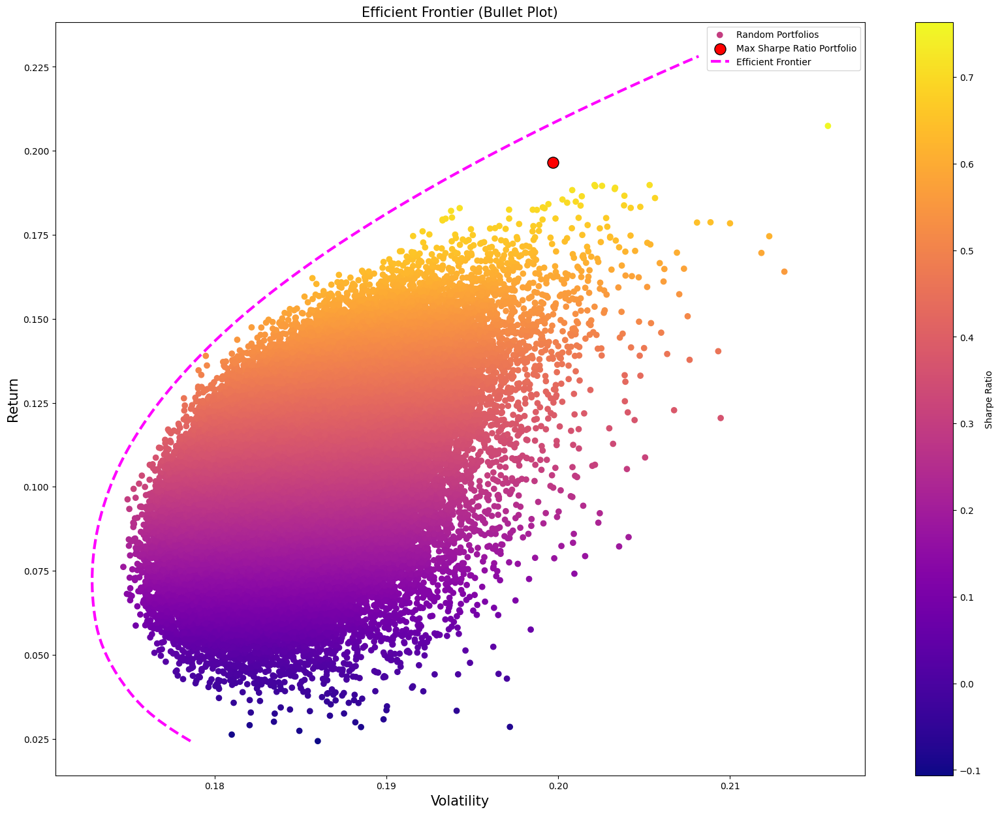

In [ ]:
# function to minimize volatility
def minimize_volatility(weights_hs):
    return np.sqrt(weights_hs.T.dot(252 * log_returns_hs.cov().dot(weights_hs)))

# range of target_returns to efficient frontier
target_returns_hs = np.linspace(port_return_hs.min(), port_return_hs.max() * 1.1, 100)

# Comuputation of efficient frontier
efficient_volatilities_hs = []
for target_return_hs in target_returns_hs:
    # Constraints: sum of weights = 1 and return = target_return
    constraints_hs = [
        {'type': 'eq', 'fun': lambda w: np.sum(w) - 1},  # somma dei pesi = 1
        {'type': 'eq', 'fun': lambda w: log_returns_hs.mean().dot(w) * 252 - target_return_hs}  # rendimento target
    ]
    bounds_hs = [(0, 1) for _ in range(len(data_hs.columns))]  # ogni peso tra 0 e 1
    initial_guess_hs = np.ones(len(data_hs.columns)) / len(data_hs.columns)  # pesi iniziali uniformi

    # Minimizza la volatilità per il rendimento target
    result_hs = minimize(minimize_volatility, initial_guess_hs, method='SLSQP', bounds=bounds_hs, constraints=constraints_hs)
    efficient_volatilities_hs.append(result_hs.fun)

plt.figure(figsize=(20, 15))
plt.scatter(port_volatility_hs, port_return_hs, c=port_sr_hs, cmap='plasma', label='Random Portfolios')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier (Bullet Plot)', fontsize=15)
plt.scatter(max_sr_vol_hs, max_sr_ret_hs, c='red', s=150, edgecolors='black', marker='o', label='Max Sharpe Ratio Portfolio')
plt.plot(efficient_volatilities_hs, target_returns_hs, c='magenta', linestyle='--', linewidth=3, label='Efficient Frontier')
plt.legend()
plt.show()


## Approach 2: Optimization Problem

### Returns and Covariance

In [ ]:
# Annualized mean log return
log_returns_mean_hs = log_returns_hs.mean()*252

# Annualized covariance matrix
cov_hs = log_returns_hs.cov()*252

### Functions

In [ ]:
# Function to get return, volatility and Sharpe Ratio
def get_ret_vol_sr(weights_hs):
    weights_hs = np.array(weights_hs)  # weights to a NumPy array
    ret_hs = log_returns_mean_hs.dot(weights_hs)  # expected portfolio return
    vol_hs = np.sqrt(weights_hs.T.dot(cov_hs.dot(weights_hs)))  # portfolio volatility
    sr_hs = (ret_hs - rf) / vol_hs  #  Sharpe Ratio
    return np.array([ret_hs, vol_hs, sr_hs])  # Returns return, volatility, and the Sharpe Ratio


# Negative Sharpe ratio as we need to max it but Scipy minimize the given function
def neg_sr(weights_hs):
    return get_ret_vol_sr(weights_hs)[-1] * -1  # Returns the negative of the Sharpe Ratio


# check sum of weights
def check_sum(weights_hs):
    return np.sum(weights_hs) - 1  # Returns the difference between the sum of weights and 1 (Obviously it should be 0)


# Constraints for the optimization problem
cons_hs = {'type':'eq','fun':check_sum} # type = type of constraint
                                     # eq = equality
                                     # fun = function

# Bounds on weights (NON-NEGATIVITY)
bounds_hs = [(0, 1) for _ in range(10)]

# Initial guess for optimization to start with
init_guess_hs = [1/10 for _ in range(10)]  # it starts with 10% to each asset


# Call minimizer
opt_results_hs = optimize.minimize(neg_sr, init_guess_hs, constraints=cons_hs, bounds=bounds_hs, method='SLSQP') # SLSQP
                                                                                                    # (Sequential Least Squares Programming)

### Optimal Weights

In [ ]:
# Optimal weights
optimal_weights_hs = opt_results_hs.x
# optimal_weights
for st, i in zip(data_hs,optimal_weights_hs):
    print(f'Stock {st} has weight {np.round(i*100,2)} %')

Stock MAbbVie Inc. has weight 19.98 %
Stock GAmgen Inc. has weight 0.0 %
Stock Gilead Sciences, Inc. has weight 0.0 %
Stock Johnson & Johnson has weight 0.0 %
Stock REli Lilly and Company has weight 80.02 %
Stock Medtronic plc has weight 0.0 %
Stock Merck & Co., Inc. has weight 0.0 %
Stock BPfizer Inc.  has weight 0.0 %
Stock Thermo Fisher Scientific Inc. has weight 0.0 %
Stock UnitedHealth Group Incorporated has weight 0.0 %


### Monte Carlo weights

In [ ]:
# Monte Carlo weights
monte_c_weights_hs = port_weights_hs[ind_hs]
for st, i in zip(data_hs,monte_c_weights_hs):
    print(f'Stock {st} has weight {np.round(i*100,2)} %')

Stock MAbbVie Inc. has weight 15.94 %
Stock GAmgen Inc. has weight 4.75 %
Stock Gilead Sciences, Inc. has weight 22.06 %
Stock Johnson & Johnson has weight 1.09 %
Stock REli Lilly and Company has weight 30.06 %
Stock Medtronic plc has weight 1.31 %
Stock Merck & Co., Inc. has weight 4.0 %
Stock BPfizer Inc.  has weight 2.17 %
Stock Thermo Fisher Scientific Inc. has weight 4.21 %
Stock UnitedHealth Group Incorporated has weight 14.42 %


### Comparison and metrics

In [ ]:
# Metrics of the portfolios
get_ret_vol_sr(optimal_weights_hs), get_ret_vol_sr(monte_c_weights_hs)

print('For a given portfolio we have: (Using Markowitz - SciPy)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(optimal_weights_hs)[i]}\n')
print("\n")
print('For a given portfolio we have: (Using Monte Carlo)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(monte_c_weights_hs)[i]}\n')

For a given portfolio we have: (Using Markowitz - SciPy)
 

Return is : 0.3321472564404809

Volatility is : 0.28174588380820687

SharpeRatio is : 1.0225429044369432



For a given portfolio we have: (Using Monte Carlo)
 

Return is : 0.19652739686583295

Volatility is : 0.19970382890433205

SharpeRatio is : 0.7635176331085451



In [ ]:
optimal_ret_hs, optimal_vol_hs, optimal_sr_hs = get_ret_vol_sr(optimal_weights_hs)
print(optimal_ret_hs, optimal_vol_hs, optimal_sr_hs)

0.3321472564404809 0.28174588380820687 1.0225429044369432


### Efficient Frontier

In [ ]:
frontier_y_hs = np.linspace(port_return_hs.min(), port_return_hs.max() * 1.68, 100)
frontier_vol_hs = []

def minimize_vol(weights_hs):
    return get_ret_vol_sr(weights_hs)[1]

for possible_ret_hs in frontier_y_hs:
    cons_hs = ({'type':'eq','fun':check_sum},
            {'type':'eq','fun':lambda w:get_ret_vol_sr(w)[0] - possible_ret_hs})
    result_hs = optimize.minimize(minimize_vol, init_guess_hs, method='SLSQP', constraints=cons_hs, bounds=bounds_hs)
    frontier_vol_hs.append(result_hs['fun'])

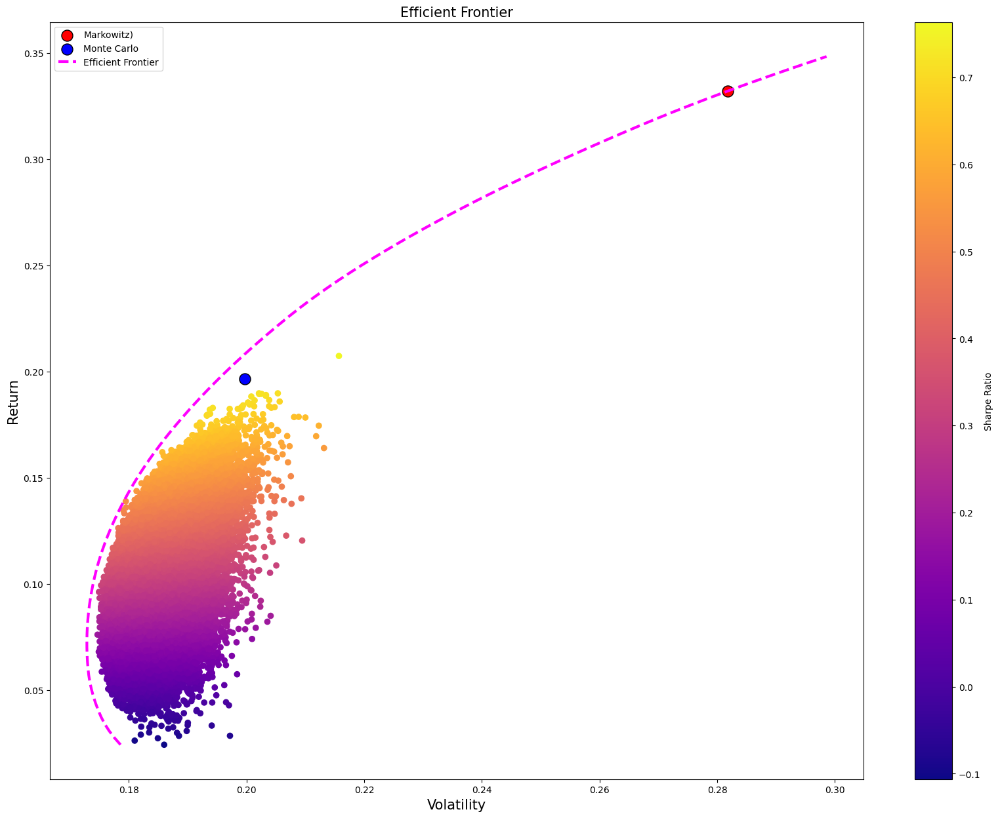

In [ ]:
plt.figure(figsize=(20,15))
plt.scatter(port_volatility_hs, port_return_hs, c=port_sr_hs, cmap='plasma')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier', fontsize=15)
plt.scatter(optimal_vol_hs, optimal_ret_hs, c='red', s=150, edgecolors='black', marker='o', label='Markowitz)')
plt.scatter(max_sr_vol_hs, max_sr_ret_hs, c='blue', s=150, edgecolors='black', marker='o', label='Monte Carlo')
plt.plot(frontier_vol_hs, frontier_y_hs, c='magenta', ls='--', lw=3, label='Efficient Frontier')
plt.legend();

# 10. General Portfolio

We ended up with the following stocks:

1. GOLDMAN SACHS GROUP

2. COMMONWEALTH BANK OF AUS

3. BERKSHIRE HATHAWAY B

4. Williams Companies Inc.

5. NVIDIA

6. TESLA

7. REli Lilly and Company

8. AbbVie Inc.



## Data Processing

In [ ]:
tickers_gp = ["GS", "CBA.AX", "BRK-B", "WMB", "NVDA", "TSLA", "LLY", "ABBV"]
ticker_name_gp = {
    "GS": "GOLDMAN SACHS GROUP",
    "CBA.AX": "COMMONWEALTH BANK OF AUS",
    "BRK-B": "BERKSHIRE HATHAWAY B",
    "WMB": "Williams Companies Inc.",
    "NVDA": "NVIDIA",
    "TSLA": "TESLA",
    "LLY": "REli Lilly and Company",
    "ABBV": "MAbbVie Inc."
}
start_date = "2020-01-01"
end_date = datetime.today().strftime('%Y-%m-%d')
data_gp = yf.download(tickers_gp, start=start_date, end=end_date)['Adj Close']
print(data_gp)


[*********************100%***********************]  8 of 8 completed


Ticker                           ABBV       BRK-B      CBA.AX          GS  \
Date                                                                        
2020-01-02 00:00:00+00:00   72.264877  228.389999   65.844452  208.356308   
2020-01-03 00:00:00+00:00   71.578934  226.179993   66.198898  205.919907   
2020-01-06 00:00:00+00:00   72.143829  226.990005   65.753769  208.027328   
2020-01-07 00:00:00+00:00   71.732277  225.919998   66.932518  209.396667   
2020-01-08 00:00:00+00:00   72.240677  225.990005   66.685234  211.415161   
...                               ...         ...         ...         ...   
2024-11-19 00:00:00+00:00  166.570007  468.859985  155.610001  581.380005   
2024-11-20 00:00:00+00:00  167.759995  468.829987  156.380005  581.929993   
2024-11-21 00:00:00+00:00  171.729996  472.059998  156.240005  596.109985   
2024-11-22 00:00:00+00:00  176.949997  476.570007  159.029999  602.780029   
2024-11-25 00:00:00+00:00  177.059998  477.429993  160.139999  603.030029   

In [ ]:
data_gp = data_gp.dropna()
# Verification (should give 0)
print(data_gp.isna().sum())

Ticker
ABBV      0
BRK-B     0
CBA.AX    0
GS        0
LLY       0
NVDA      0
TSLA      0
WMB       0
dtype: int64


In [ ]:
data_gp = data_gp.rename(columns={col: ticker_name_gp[col] for col in data_gp.columns if col in ticker_name_gp})

## Final Dataset

In [ ]:
print(data_gp.head())

Ticker                     MAbbVie Inc.  BERKSHIRE HATHAWAY B  \
Date                                                            
2020-01-02 00:00:00+00:00     72.264877            228.389999   
2020-01-03 00:00:00+00:00     71.578934            226.179993   
2020-01-06 00:00:00+00:00     72.143829            226.990005   
2020-01-07 00:00:00+00:00     71.732277            225.919998   
2020-01-08 00:00:00+00:00     72.240677            225.990005   

Ticker                     COMMONWEALTH BANK OF AUS  GOLDMAN SACHS GROUP  \
Date                                                                       
2020-01-02 00:00:00+00:00                 65.844452           208.356308   
2020-01-03 00:00:00+00:00                 66.198898           205.919907   
2020-01-06 00:00:00+00:00                 65.753769           208.027328   
2020-01-07 00:00:00+00:00                 66.932518           209.396667   
2020-01-08 00:00:00+00:00                 66.685234           211.415161   

Ticker     

## Plots

### Adjusted Close

In [ ]:
data_df_gp = data_gp.reset_index()
data_df_gp = data_df_gp.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close")
fig = px.line(data_df_gp, x="Date", y="Adjusted Close", color="Company",
              title="Adjusted Close Price Trends (Logarithmic Scale)")
fig.update_yaxes(type="log")
fig.show()

### Normalized Price

In [ ]:
# Let's normalize the data (Adj Close) in such a way we start from 100
normalized_data_gp = data_gp * 100 / data_gp.iloc[0]

normalized_df_gp = normalized_data_gp.reset_index()  # index reset to include date column
normalized_df_gp = normalized_df_gp.melt(id_vars="Date", var_name="Company", value_name="Adjusted Close (Normalized)")


fig = px.line(normalized_df_gp, x="Date", y="Adjusted Close (Normalized)", color="Company",
              title="Adjusted Close Price Trends (Normalized)")
fig.show()

## Daily Log Returns

In [ ]:
# Log Returns
log_returns_gp = np.log(data_gp / data_gp.shift(1))
log_returns_gp = log_returns_gp.dropna()

In [ ]:
log_returns_df_gp = log_returns_gp.reset_index()  # index reset to include date column
log_returns_df_gp = log_returns_df_gp.melt(id_vars="Date", var_name="Company", value_name="Daily LogReturn")

fig = px.line(log_returns_df_gp, x="Date", y="Daily LogReturn", color="Company",
              title="Daily LogReturns of Stocks")
fig.show()

## Approach 1 - Monte Carlo

### Risk-free rate

In [ ]:
ticker_rf = "^IRX"
rf_data = yf.download(ticker_rf, start=start_date, end=end_date)
print(rf_data)
rf = rf_data['Adj Close'].iloc[-1].values[0] / 100
print(f"Risk-free rate (rf) in decimal: {rf}")

[*********************100%***********************]  1 of 1 completed

Price                     Adj Close  Close   High    Low   Open Volume
Ticker                         ^IRX   ^IRX   ^IRX   ^IRX   ^IRX   ^IRX
Date                                                                  
2020-01-02 00:00:00+00:00     1.495  1.495  1.510  1.495  1.510      0
2020-01-03 00:00:00+00:00     1.473  1.473  1.490  1.460  1.490      0
2020-01-06 00:00:00+00:00     1.488  1.488  1.490  1.475  1.478      0
2020-01-07 00:00:00+00:00     1.500  1.500  1.505  1.500  1.505      0
2020-01-08 00:00:00+00:00     1.493  1.493  1.493  1.485  1.493      0
...                             ...    ...    ...    ...    ...    ...
2024-11-19 00:00:00+00:00     4.408  4.408  4.410  4.403  4.408      0
2024-11-20 00:00:00+00:00     4.410  4.410  4.415  4.410  4.410      0
2024-11-21 00:00:00+00:00     4.413  4.413  4.413  4.400  4.403      0
2024-11-22 00:00:00+00:00     4.415  4.415  4.420  4.408  4.408      0
2024-11-25 00:00:00+00:00     4.405  4.405  4.413  4.403  4.413      0

[1234

### Monte Carlo Simulation

In [ ]:
np.random.seed(1) # set seed for reproducibility

# number of simulations
n = 100_000 # it could take some minutes

port_weights_gp = np.zeros(shape=(n,len(data_gp.columns)))
port_volatility_gp = np.zeros(n)
port_sr_gp = np.zeros(n)
port_return_gp = np.zeros(n)
nume_securities_gp = len(data_gp.columns)

# generation of random portfolios with random normalized weights (sum to 1)
for i in range(n):
    # Weight each security
    weights_gp = np.random.random(len(data_gp.columns)) # np.random.random only produces non-negative values
    # normalize it, so that sum is one
    weights_gp /= np.sum(weights_gp)
    port_weights_gp[i,:] = weights_gp # 'i' indicates the specific iteration (i.e. the current portfolio in the simulation).
                                # ':' indicates that we are saving all the weights generated for this portfolio (i.e. for each security)

    # Calculation of the annualized expected return
    exp_ret_gp = log_returns_gp.mean().dot(weights_gp) * 252
    port_return_gp[i] = exp_ret_gp # save this value in the port_return array at position i, corresponding to the current simulation.

    # Annualized expected volatility
    exp_vol_gp = np.sqrt(weights_gp.T.dot(252 * log_returns_gp.cov().dot(weights_gp)))
    port_volatility_gp[i] = exp_vol_gp

    # Sharpe Ratio
    sr_gp = (exp_ret_gp - rf) / exp_vol_gp
    port_sr_gp[i] = sr_gp


### Identification of the best portfolio

In [ ]:
# Index of max Sharpe Ratio
max_sr_gp = port_sr_gp.max()
ind_gp = port_sr_gp.argmax()
# Return and Volatility at Max SR
max_sr_ret_gp = port_return_gp[ind_gp]
max_sr_vol_gp = port_volatility_gp[ind_gp]

### Monte Carlo Weights

In [ ]:
# Weights
for weight_gp, stock_gp in zip(port_weights_gp[ind_gp], data_gp):
    print(f'{round(weight_gp * 100, 2)} % of {stock_gp} should be bought.')

print(f'\nMonte Carlo portfolio return is : {round(max_sr_ret_gp * 100, 2)}% with volatility {max_sr_vol_gp}')

3.76 % of MAbbVie Inc. should be bought.
2.76 % of BERKSHIRE HATHAWAY B should be bought.
20.53 % of COMMONWEALTH BANK OF AUS should be bought.
3.38 % of GOLDMAN SACHS GROUP should be bought.
40.77 % of REli Lilly and Company should be bought.
23.62 % of NVIDIA should be bought.
3.12 % of TESLA should be bought.
2.06 % of Williams Companies Inc. should be bought.

Monte Carlo portfolio return is : 38.58% with volatility 0.24754208940265102


### Monte Carlo Efficient Frontier

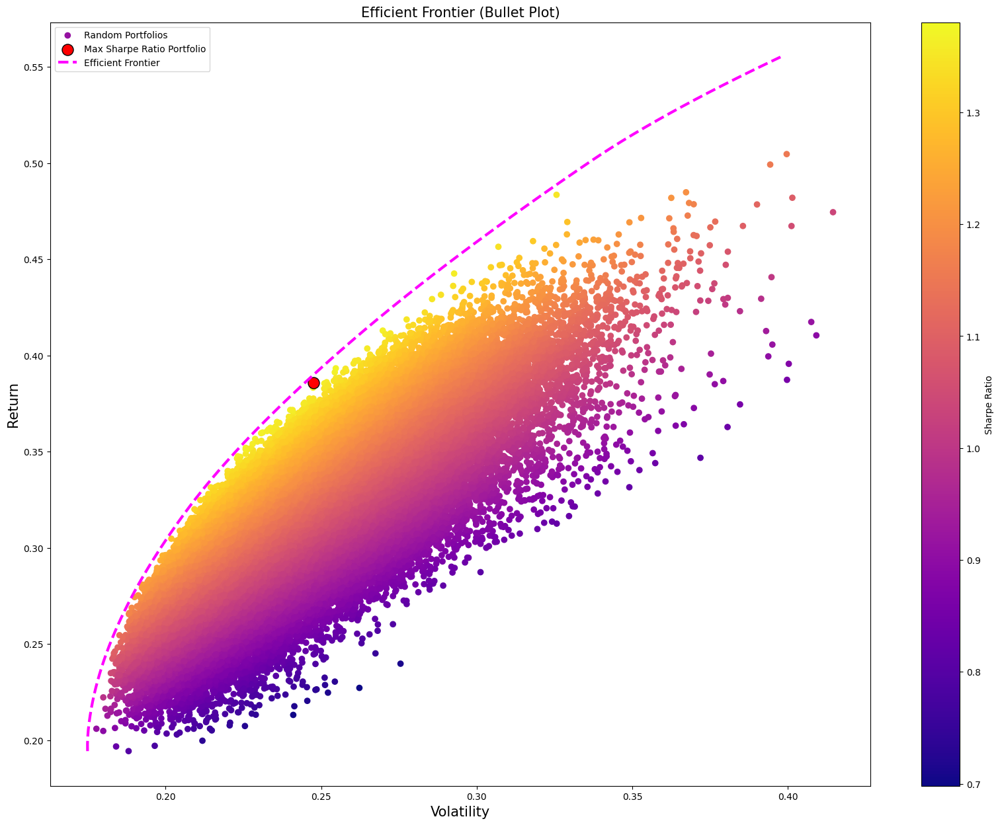

In [ ]:
# function to minimize volatility
def minimize_volatility(weights_gp):
    return np.sqrt(weights_gp.T.dot(252 * log_returns_gp.cov().dot(weights_gp)))

# range of target_returns to efficient frontier
target_returns_gp = np.linspace(port_return_gp.min(), port_return_gp.max() * 1.1, 100)

# Computation of efficient frontier
efficient_volatilities_gp = []
for target_return_gp in target_returns_gp:
    # Constraints: sum of weights = 1 and return = target_return
    constraints_gp = [
        {'type': 'eq', 'fun': lambda w: np.sum(w) - 1},  # somma dei pesi = 1
        {'type': 'eq', 'fun': lambda w: log_returns_gp.mean().dot(w) * 252 - target_return_gp}  # rendimento target
    ]
    bounds_gp = [(0, 1) for _ in range(len(data_gp.columns))]  # ogni peso tra 0 e 1
    initial_guess_gp = np.ones(len(data_gp.columns)) / len(data_gp.columns)  # pesi iniziali uniformi

    # Minimizza la volatilità per il rendimento target
    result_gp = minimize(minimize_volatility, initial_guess_gp, method='SLSQP', bounds=bounds_gp, constraints=constraints_gp)
    efficient_volatilities_gp.append(result_gp.fun)

plt.figure(figsize=(20, 15))
plt.scatter(port_volatility_gp, port_return_gp, c=port_sr_gp, cmap='plasma', label='Random Portfolios')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier (Bullet Plot)', fontsize=15)
plt.scatter(max_sr_vol_gp, max_sr_ret_gp, c='red', s=150, edgecolors='black', marker='o', label='Max Sharpe Ratio Portfolio')
plt.plot(efficient_volatilities_gp, target_returns_gp, c='magenta', linestyle='--', linewidth=3, label='Efficient Frontier')
plt.legend()
plt.show()


## Approach 2: Optimization Problem

### Returns and Covariance

In [ ]:
# Annualized mean log return
log_returns_mean_gp = log_returns_gp.mean()*252

# Annualized covariance matrix
cov_gp = log_returns_gp.cov()*252

### Functions

In [ ]:
# Function to get return, volatility and Sharpe Ratio
def get_ret_vol_sr(weights_gp):
    weights_gp = np.array(weights_gp)  # weights to a NumPy array
    ret_gp = log_returns_mean_gp.dot(weights_gp)  # expected portfolio return
    vol_gp = np.sqrt(weights_gp.T.dot(cov_gp.dot(weights_gp)))  # portfolio volatility
    sr_gp = (ret_gp - rf) / vol_gp  # Sharpe Ratio
    return np.array([ret_gp, vol_gp, sr_gp])  # Returns return, volatility, and the Sharpe Ratio


# Negative Sharpe ratio as we need to max it but Scipy minimize the given function
def neg_sr(weights_gp):
    return get_ret_vol_sr(weights_gp)[-1] * -1  # Returns the negative of the Sharpe Ratio


# check sum of weights
def check_sum(weights_gp):
    return np.sum(weights_gp) - 1  # Returns the difference between the sum of weights and 1 (Obviously it should be 0)


# Constraints for the optimization problem
cons_gp = {'type': 'eq', 'fun': check_sum}  # type = type of constraint

# Bounds on weights (NON-NEGATIVITY)
bounds_gp = [(0, 1) for _ in range(8)]

# Initial guess for optimization to start with
init_guess_gp = [1/8 for _ in range(8)]  # it starts with 10% to each asset

# Call minimizer
opt_results_gp = optimize.minimize(neg_sr, init_guess_gp, constraints=cons_gp, bounds=bounds_gp, method='SLSQP')  # SLSQP


### Optimal Weights

In [ ]:
# Optimal weights
optimal_weights_gp = opt_results_gp.x
# sorted output
for st, weight in sorted(zip(data_gp, np.round(optimal_weights_gp * 100, 2)), key=lambda x: x[1], reverse=True):
    print(f'Stock {st} has weight {weight} %')


Stock REli Lilly and Company has weight 42.04 %
Stock NVIDIA has weight 25.42 %
Stock COMMONWEALTH BANK OF AUS has weight 21.3 %
Stock TESLA has weight 5.68 %
Stock Williams Companies Inc. has weight 4.72 %
Stock MAbbVie Inc. has weight 0.85 %
Stock BERKSHIRE HATHAWAY B has weight 0.0 %
Stock GOLDMAN SACHS GROUP has weight 0.0 %


### Monte Carlo Weights

In [ ]:
monte_c_weights_gp = port_weights_gp[ind_gp]
for st, weight in sorted(zip(data_gp, np.round(monte_c_weights_gp * 100, 2)), key=lambda x: x[1], reverse=True):
    print(f'Stock {st} has weight {weight} %')

Stock REli Lilly and Company has weight 40.77 %
Stock NVIDIA has weight 23.62 %
Stock COMMONWEALTH BANK OF AUS has weight 20.53 %
Stock MAbbVie Inc. has weight 3.76 %
Stock GOLDMAN SACHS GROUP has weight 3.38 %
Stock TESLA has weight 3.12 %
Stock BERKSHIRE HATHAWAY B has weight 2.76 %
Stock Williams Companies Inc. has weight 2.06 %


### Comparison and metrics

In [ ]:
# Metrics of the portfolios
get_ret_vol_sr(optimal_weights_gp), get_ret_vol_sr(monte_c_weights_gp)

print('For a given portfolio we have: (Using Markowitz - SciPy)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(optimal_weights_gp)[i]}\n')
print("\n")
print('For a given portfolio we have: (Using Monte Carlo)\n \n')
for i, j in enumerate('Return Volatility SharpeRatio'.split()):
    print(f'{j} is : {get_ret_vol_sr(monte_c_weights_gp)[i]}\n')

For a given portfolio we have: (Using Markowitz - SciPy)
 

Return is : 0.40627639504115

Volatility is : 0.25896239653732983

SharpeRatio is : 1.3987605837237878



For a given portfolio we have: (Using Monte Carlo)
 

Return is : 0.38575239330114636

Volatility is : 0.247542089402651

SharpeRatio is : 1.3803809769386373



In [ ]:
optimal_ret_gp, optimal_vol_gp, optimal_sr_gp = get_ret_vol_sr(optimal_weights_gp)
print(optimal_ret_gp, optimal_vol_gp, optimal_sr_gp)

0.40627639504115 0.25896239653732983 1.3987605837237878


### Efficient Frontier

In [ ]:
# Efficient Frontier
frontier_y_gp = np.linspace(port_return_gp.min(), port_return_gp.max(), 100)
frontier_vol_gp = []

def minimize_vol(weights_gp):
    return get_ret_vol_sr(weights_gp)[1]

for possible_ret in frontier_y_gp:
    cons_gp = ({'type': 'eq', 'fun': check_sum},
               {'type': 'eq', 'fun': lambda w: get_ret_vol_sr(w)[0] - possible_ret})
    result_gp = optimize.minimize(minimize_vol, init_guess_gp, method='SLSQP', constraints=cons_gp, bounds=bounds_gp)
    frontier_vol_gp.append(result_gp['fun'])


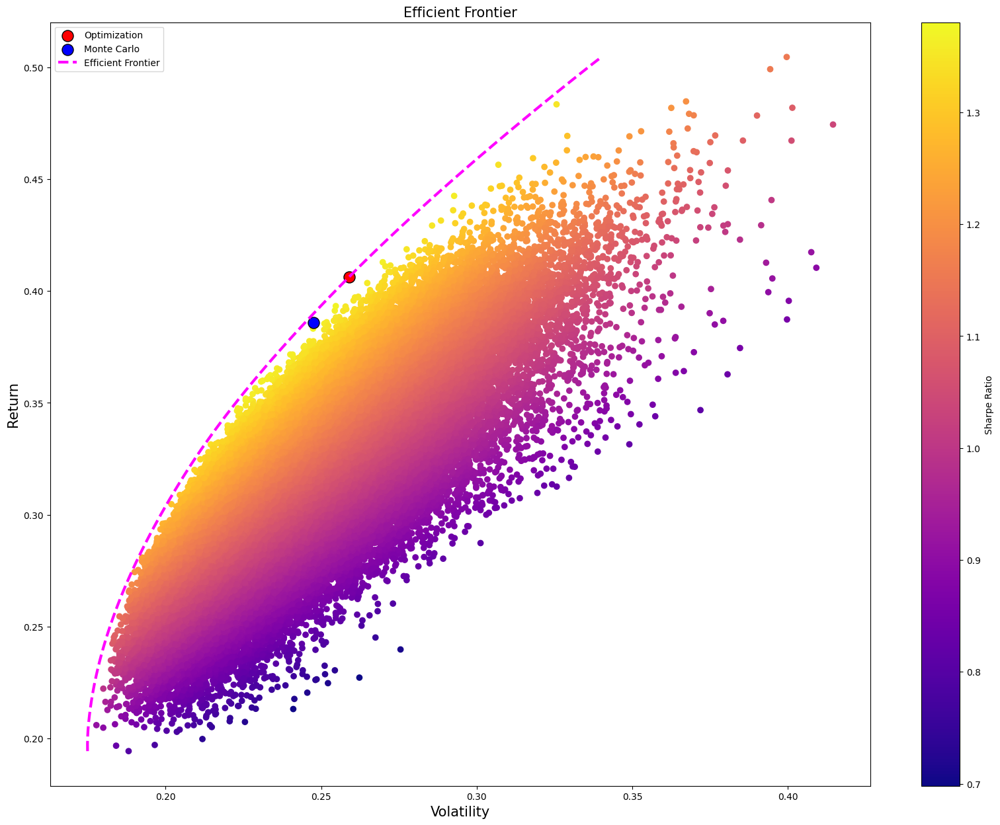

In [ ]:
plt.figure(figsize=(20, 15))
plt.scatter(port_volatility_gp, port_return_gp, c=port_sr_gp, cmap='plasma')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility', fontsize=15)
plt.ylabel('Return', fontsize=15)
plt.title('Efficient Frontier', fontsize=15)
plt.scatter(optimal_vol_gp, optimal_ret_gp, c='red', s=150, edgecolors='black', marker='o', label='Optimization')
plt.scatter(max_sr_vol_gp, max_sr_ret_gp, c='blue', s=150, edgecolors='black', marker='o', label='Monte Carlo')
plt.plot(frontier_vol_gp, frontier_y_gp, c='magenta', ls='--', lw=3, label='Efficient Frontier')
plt.legend()
plt.show()


### Piechart

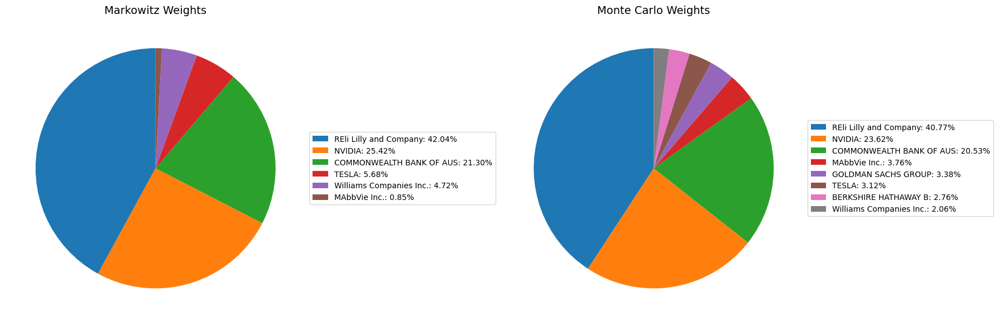

In [ ]:

# Data for Optimization weights
optimization_weights = {
    "REli Lilly and Company": 42.04,
    "NVIDIA": 25.42,
    "COMMONWEALTH BANK OF AUS": 21.3,
    "TESLA": 5.68,
    "Williams Companies Inc.": 4.72,
    "MAbbVie Inc.": 0.85
}

# Data for Monte Carlo weights
monte_carlo_weights = {
    "REli Lilly and Company": 40.77,
    "NVIDIA": 23.62,
    "COMMONWEALTH BANK OF AUS": 20.53,
    "MAbbVie Inc.": 3.76,
    "GOLDMAN SACHS GROUP": 3.38,
    "TESLA": 3.12,
    "BERKSHIRE HATHAWAY B": 2.76,
    "Williams Companies Inc.": 2.06
}

# Extract labels and values for both strategies
labels_opt = list(optimization_weights.keys())
values_opt = list(optimization_weights.values())

labels_mc = list(monte_carlo_weights.keys())
values_mc = list(monte_carlo_weights.values())

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 9))

# Plot Optimization weights pie chart
axes[0].pie(
    values_opt,
    labels=None,  # No labels directly on the chart
    startangle=90
)
axes[0].set_title('Markowitz Weights', fontsize=14)
# Add external legend for Optimization weights
opt_labels = [f"{label}: {value:.2f}%" for label, value in zip(labels_opt, values_opt)]
axes[0].legend(opt_labels, loc="center left", bbox_to_anchor=(1, 0.5))

# Plot Monte Carlo weights pie chart
axes[1].pie(
    values_mc,
    labels=None,  # No labels directly on the chart
    startangle=90
)
axes[1].set_title('Monte Carlo Weights', fontsize=14)
# Add external legend for Monte Carlo weights
mc_labels = [f"{label}: {value:.2f}%" for label, value in zip(labels_mc, values_mc)]
axes[1].legend(mc_labels, loc="center left", bbox_to_anchor=(1, 0.5))

# Adjust layout for better display
plt.tight_layout()
plt.show()


# References

- Markowitz, H. (1952). Portfolio Selection. The Journal of Finance, 7(1), 77-91. Wiley for the American Finance Association.

- https://www.kaggle.com/code/bhavinmoriya/markowitz-portfolio-optimization

- https://www.geeksforgeeks.org/python-plotly-tutorial/

- https://www.w3schools.com/python/default.asp